# Observations

### Data Exploration:
- There are 4 features in the accelerometer dataset, having acceleration data in x,y and z directions and the time when the reading was taken
- There are 2 features in the TAC dataset, having TAC value and the time when the reading was taken

### Initial Data Preprocessing:
- Converted time from miliseconds to seconds in the accelerometer dataset.
- Divided the accelerometer data in x,y, and z direction by 40 to correct data mismatch due to sampling rate.
- Combined all the TAC datasets into one and added an additional column called PID to the dataset. To identify the TAC values associated with the PID.
- Merging the accelerometer and the combined TAC dataset based on the time and PID values to created a single merged dataset having all values

### Line plots for x,y,z and TAC level
- Creating time series chart for visualizing the acceleration data in x,y,z direction and the corresponding TAC level for each PID value
- For some PID's we can observe significant fluctiations in acceleration data for high TAC levels whereas for low TAC levels there is little to no fluctiations
- Although there is some patterns forming for different TAC levels they are not significant enough to conclude anything

### Entropy vs. Complexity for Different TAC Values(Sliced data based on unique TAC values)
- Lower TAC levels tend to have high entropy and low complexity values
- Higher TAC levels tend to have low entropy and high complexity as compared to the entropy and complexity shown by low TAC levels

### Entropy and Complexity vs TAC Values for each direction(Box Plot)
- We have created a box plot for acceleration reading in each direction i.e x,y and z. Also, divided the TAC reading into two groups of sober and drunk based on the threshold of 0.08
- We can see that median Entropy values for sober cases tend to be higher than median entropy values for drunk cases
- And, median Complexity values for sober cases tend to be lower than median complexity values for drunk cases
- Similar observations can be made for the means as well
- As stated above, there is a significant difference in Entropy and Complexity values between Sober and Drunk cases. Which makes it possible for us to differentiate between the two.

## Additional charts and observations

### Comparison based on Trend, Seasonality and Residual Charts
- After performing a side by side comparison between sober and drunk datasets having tac value below and above 0.08 respectively in x, y and z direction.
- We can see that the seasonal component shows a significant increase in fluctuations in recurring patterns when compared to the same PID when its in sober state.
- This could be due to any reason either increased activity or increased swaying or tilting in different directions causing instability due to intoxication
- Similarly, in certain cases we can see a signiificant decrease in fluctuations in recurring patterns when compared to the same PID when its in sober state.
- Again, this could be due to reduced activity caused due to intoxication
- We can observe that for different individual the response is different, but looking at the data we can see that the users when drunk have a change in the movement pattern as compared to their normal every day movement.
- Given that we have their normal(base) movement patterns, having a significant change which is much different that their normal movement patterns can be used to determine if a user is drunk or sober

In [23]:
# Import necessary libraries

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from statsmodels.tsa.stattools import acf
from matplotlib.ticker import MaxNLocator
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose

In [24]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [25]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [26]:
# Load TAC data for all PID's

from google.colab import files
uploaded = files.upload()

Saving BK7610_clean_TAC.csv to BK7610_clean_TAC (13).csv
Saving BU4707_clean_TAC.csv to BU4707_clean_TAC (13).csv
Saving CC6740_clean_TAC.csv to CC6740_clean_TAC (12).csv
Saving DC6359_clean_TAC.csv to DC6359_clean_TAC (12).csv
Saving DK3500_clean_TAC.csv to DK3500_clean_TAC (12).csv
Saving HV0618_clean_TAC.csv to HV0618_clean_TAC (12).csv
Saving JB3156_clean_TAC.csv to JB3156_clean_TAC (12).csv
Saving JR8022_clean_TAC.csv to JR8022_clean_TAC (12).csv
Saving MC7070_clean_TAC.csv to MC7070_clean_TAC (12).csv
Saving MJ8002_clean_TAC.csv to MJ8002_clean_TAC (12).csv
Saving PC6771_clean_TAC.csv to PC6771_clean_TAC (12).csv
Saving SA0297_clean_TAC.csv to SA0297_clean_TAC (12).csv
Saving SF3079_clean_TAC.csv to SF3079_clean_TAC (12).csv


In [27]:
# Concatenating all the clean TAC files and adding an additional column pid which would be taken from the filename
import io
import os
dfs = []

for filename, file_content in uploaded.items():
    df = pd.read_csv(io.StringIO(file_content.decode('utf-8')))
    # Adding a new column 'pid' after extracting the pid from the name of the file
    df['pid'] = os.path.splitext(filename)[0].split('_')[0]
    dfs.append(df)

# Concatenate DataFrames into a single df with all TAC values
combined_df = pd.concat(dfs, ignore_index=True)

print(combined_df)


      timestamp  TAC_Reading     pid
0    1493718714    -0.000482  BK7610
1    1493720697     0.001573  BK7610
2    1493721027     0.002144  BK7610
3    1493721357     0.000877  BK7610
4    1493721686    -0.001145  BK7610
..          ...          ...     ...
710  1493797974     0.029049  SF3079
711  1493799820     0.016286  SF3079
712  1493801652     0.004243  SF3079
713  1493803481    -0.001995  SF3079
714  1493805310    -0.002919  SF3079

[715 rows x 3 columns]


In [28]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 715 entries, 0 to 714
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   timestamp    715 non-null    int64  
 1   TAC_Reading  715 non-null    float64
 2   pid          715 non-null    object 
dtypes: float64(1), int64(1), object(1)
memory usage: 16.9+ KB


In [29]:
# Reading accelerometer data
acc_df = pd.read_csv('all_accelerometer_data_pids_13.csv')
acc_df.head()

,time,pid,x,y,z
0,0,JB3156,0.0000,0.0000,0.0000
1,0,CC6740,0.0000,0.0000,0.0000
2,1493733882409,SA0297,0.0758,0.0273,-0.0102
3,1493733882455,SA0297,-0.0359,0.0794,0.0037
4,1493733882500,SA0297,-0.2427,-0.0861,-0.0163


In [30]:
acc_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14057567 entries, 0 to 14057566
Data columns (total 5 columns):
 #   Column  Dtype  
---  ------  -----  
 0   time    int64  
 1   pid     object 
 2   x       float64
 3   y       float64
 4   z       float64
dtypes: float64(3), int64(1), object(1)
memory usage: 536.3+ MB


In [31]:
# converting time from miliseconds to seconds to correct data mismatch between acceleration and tac data before merging the datasets
acc_df.time = round(acc_df.time/1000).astype(int)
acc_df

,time,pid,x,y,z
0,0,JB3156,0.000000,0.000000,0.000000
1,0,CC6740,0.000000,0.000000,0.000000
2,1493733882,SA0297,0.075800,0.027300,-0.010200
3,1493733882,SA0297,-0.035900,0.079400,0.003700
4,1493733882,SA0297,-0.242700,-0.086100,-0.016300
...,...,...,...,...,...
14057562,1493829248,CC6740,-0.133956,0.124726,-0.010736
14057563,1493829248,CC6740,-0.100764,0.180872,0.046449
14057564,1493829248,CC6740,-0.131853,0.195934,0.181088
14057565,1493829248,CC6740,-0.149704,0.194482,0.202393


In [32]:
# merging acceleration table and tac data for all pid's on pid and time column
merged_df = pd.merge(acc_df,combined_df,left_on=['pid','time'],right_on=['pid','timestamp'],how='inner')
merged_df

,time,pid,x,y,z,timestamp,TAC_Reading
0,1493734448,SA0297,0.080200,-0.157500,0.200500,1493734448,0.032672
1,1493734448,SA0297,0.254000,0.031600,0.231600,1493734448,0.032672
2,1493734448,SA0297,0.241700,0.033900,0.169600,1493734448,0.032672
3,1493734448,SA0297,0.305200,0.044600,0.098600,1493734448,0.032672
4,1493734448,SA0297,0.160800,0.104700,-0.188100,1493734448,0.032672
...,...,...,...,...,...,...,...
6160,1493809750,CC6740,0.026324,0.100908,0.527579,1493809750,0.005040
6161,1493809750,CC6740,-0.012345,0.023350,0.604207,1493809750,0.005040
6162,1493809750,CC6740,-0.011905,0.003993,0.508442,1493809750,0.005040
6163,1493809750,CC6740,0.026536,-0.015224,0.585056,1493809750,0.005040


In [33]:
# Creating variable index_values to store pid names to be used later to loop through all pid values for creating charts
index_values = [x for x in merged_df.pid.value_counts().index]
print("Index Values:", index_values)

Index Values: ['CC6740', 'PC6771', 'JB3156', 'BK7610', 'DK3500', 'HV0618', 'SA0297', 'SF3079', 'MJ8002', 'DC6359', 'BU4707', 'MC7070', 'JR8022']


In [34]:
# acceleration value is in hz. Correct the acceleration values
merged_df.loc[:, 'x'] = merged_df['x'] / 40
merged_df.loc[:, 'y'] = merged_df['y'] / 40
merged_df.loc[:, 'z'] = merged_df['z'] / 40

In [35]:
merged_df.head()

,time,pid,x,y,z,timestamp,TAC_Reading
0,1493734448,SA0297,0.002005,-0.003938,0.005013,1493734448,0.032672
1,1493734448,SA0297,0.006350,0.000790,0.005790,1493734448,0.032672
2,1493734448,SA0297,0.006043,0.000847,0.004240,1493734448,0.032672
3,1493734448,SA0297,0.007630,0.001115,0.002465,1493734448,0.032672
4,1493734448,SA0297,0.004020,0.002618,-0.004703,1493734448,0.032672


In [36]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6165 entries, 0 to 6164
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   time         6165 non-null   int64  
 1   pid          6165 non-null   object 
 2   x            6165 non-null   float64
 3   y            6165 non-null   float64
 4   z            6165 non-null   float64
 5   timestamp    6165 non-null   int64  
 6   TAC_Reading  6165 non-null   float64
dtypes: float64(4), int64(2), object(1)
memory usage: 337.3+ KB


<ipython-input-37-acca3614e769>:9: RuntimeWarning: Second argument 'x' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[0].plot(t, "x", data=sample_df)
<ipython-input-37-acca3614e769>:10: RuntimeWarning: Second argument 'y' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[1].plot(t, "y", data=sample_df)


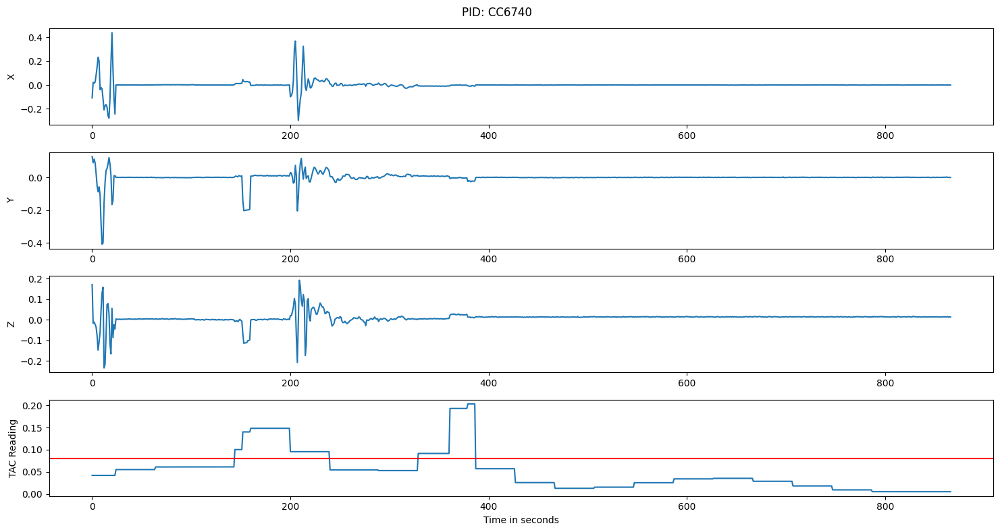

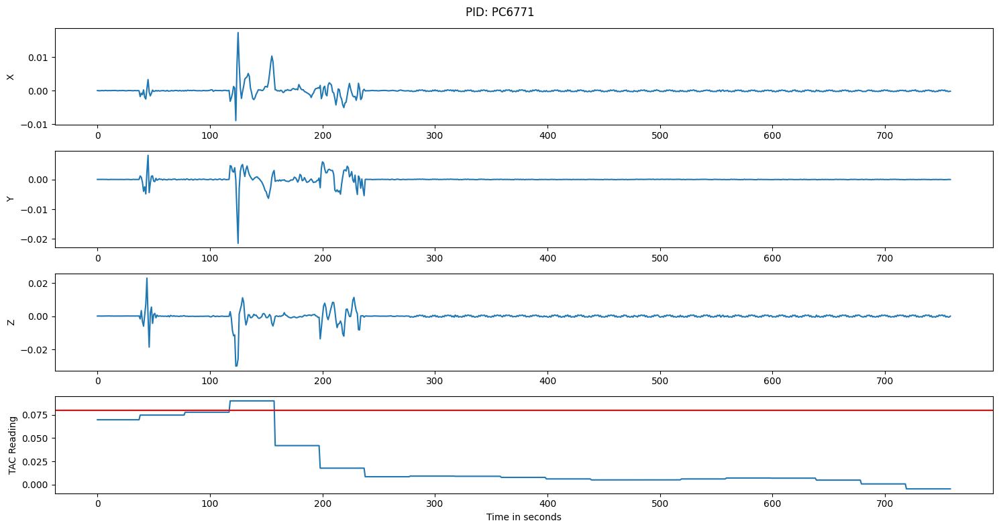

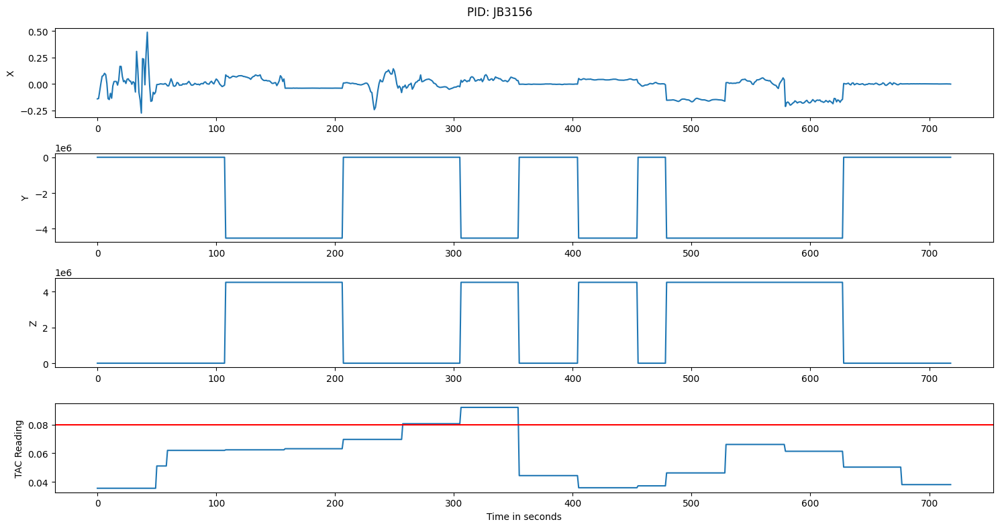

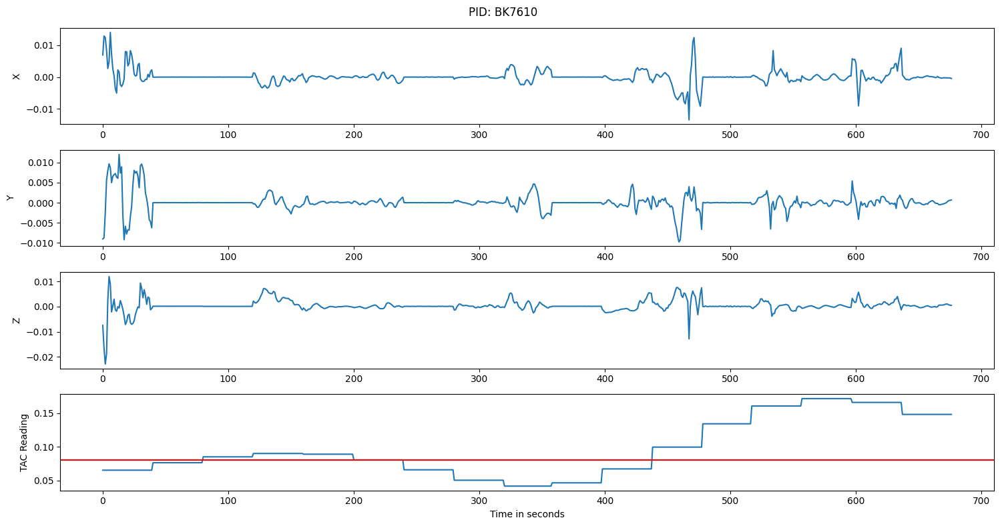

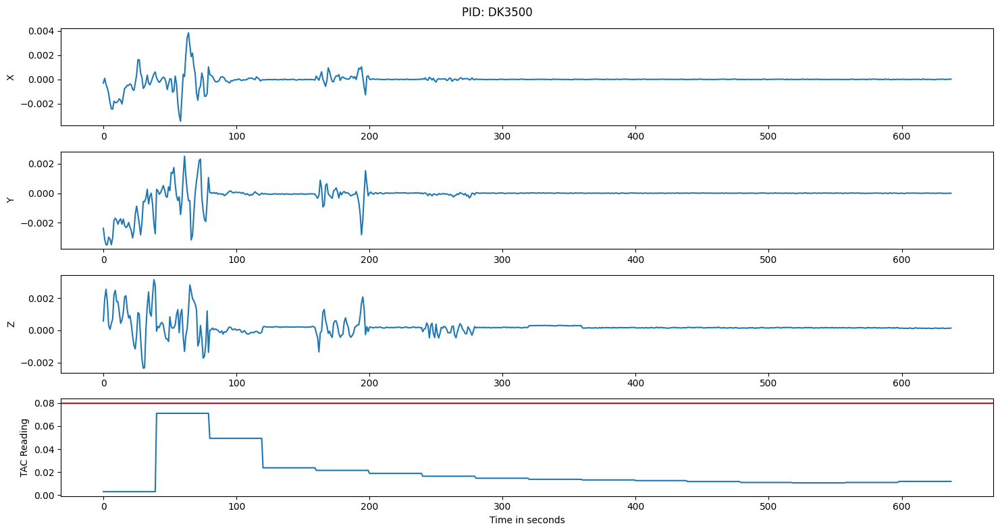

...

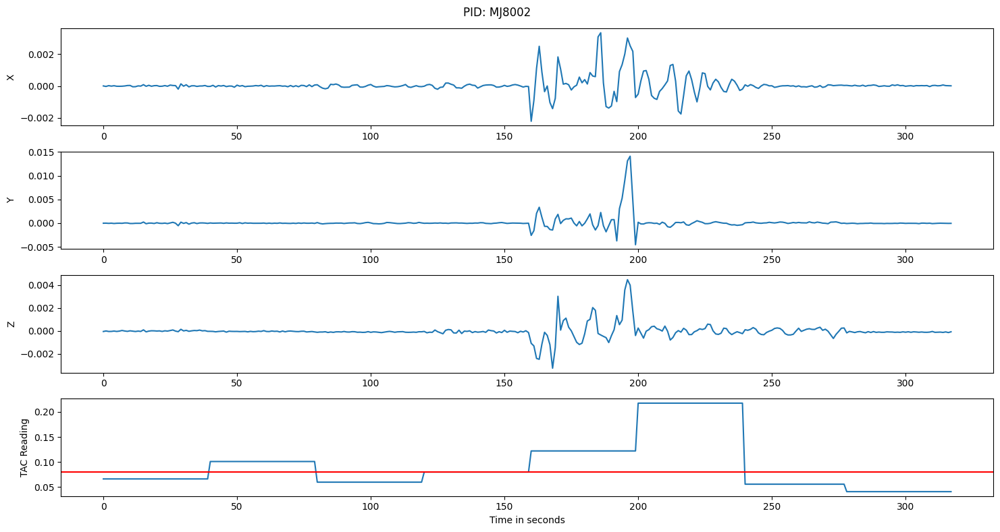

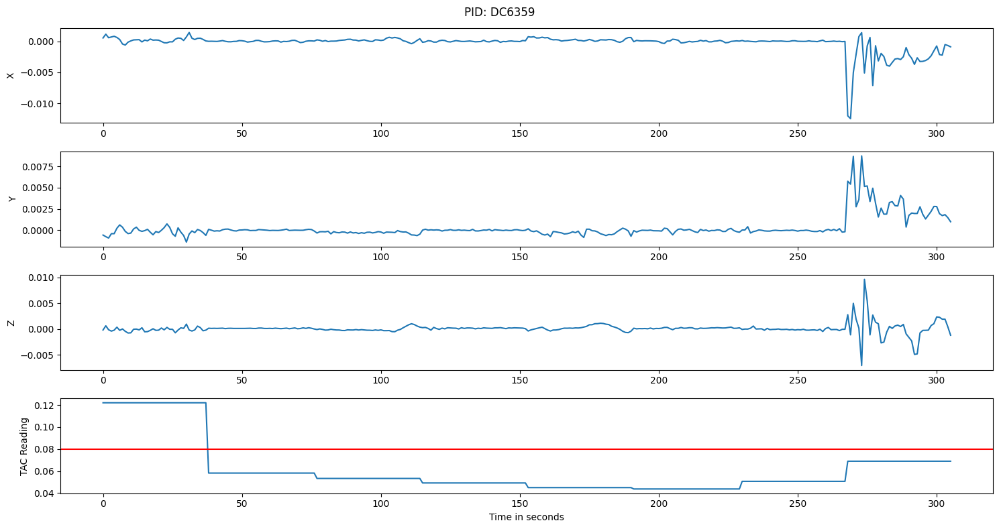

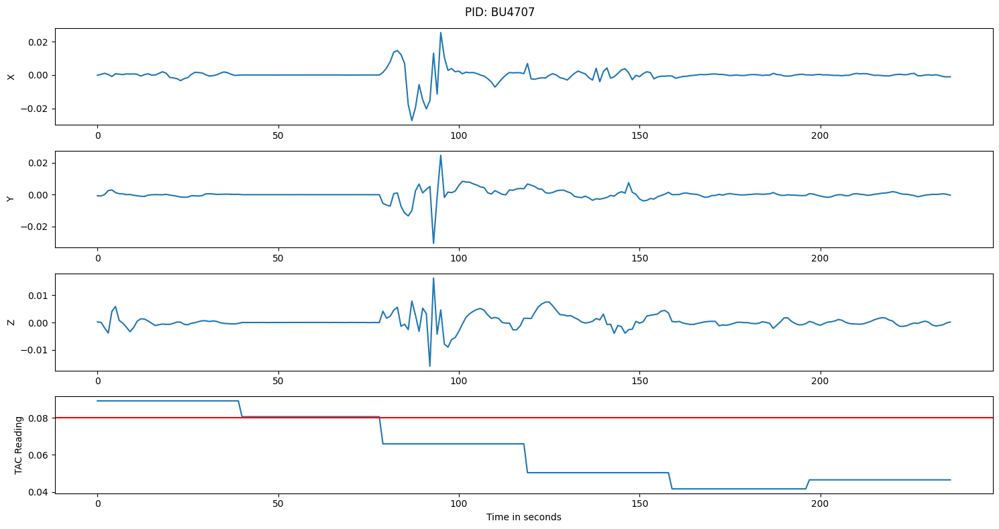

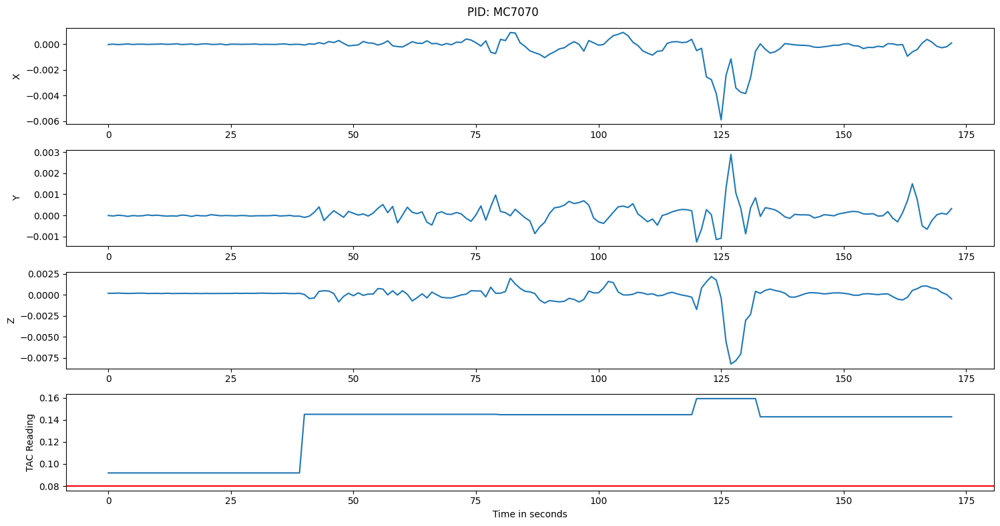

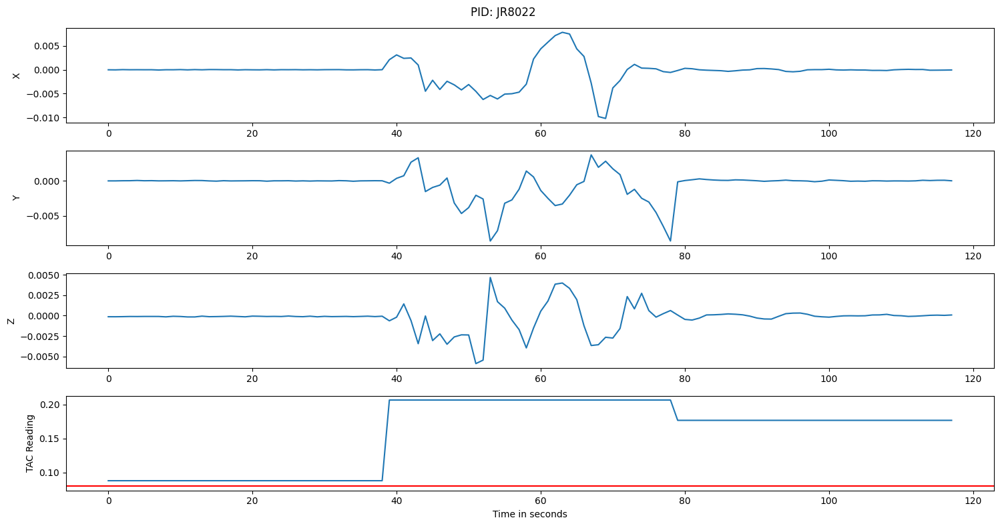

In [37]:
# Checking for each PID value what is the acceleration in x,y,z direction and the corresponding TAC level

for x in index_values:
    sample_df = merged_df[(merged_df['pid'] == x)]

    fig, axes = plt.subplots(nrows=4, figsize=(15, 8))

    t = np.arange(sample_df['x'].size)
    axes[0].plot(t, "x", data=sample_df)
    axes[1].plot(t, "y", data=sample_df)
    axes[2].plot(t, "z", data=sample_df)
    axes[3].plot(t, 'TAC_Reading', data=sample_df)

    # Adding a horizontal line at y = 0.08 to the TAC chart
    axes[3].axhline(y=0.08, color='r', linestyle='-')

    axes[0].set_ylabel('X')
    axes[1].set_ylabel('Y')
    axes[2].set_ylabel('Z')
    axes[3].set_ylabel('TAC Reading')
    axes[3].set_xlabel('Time in seconds')

    fig.suptitle(f"PID: {x}")
    plt.tight_layout()
    plt.show()

In [38]:
# Below are the functions used to calculate entropy and complexity. Using the same functions that was provided in class

In [39]:
''' This module has essential functions supporting
fast and effective computation of permutation entropy and
its different variations.'''
import numpy as np


def s_entropy(freq_list):
    ''' This function computes the shannon entropy of a given frequency distribution.
    USAGE: shannon_entropy(freq_list)
    ARGS: freq_list = Numeric vector representing the frequency distribution
    OUTPUT: A numeric value representing shannon's entropy'''
    freq_list = [element for element in freq_list if element != 0]
    sh_entropy = 0.0
    for freq in freq_list:
        sh_entropy += freq * np.log(freq)
    sh_entropy = -sh_entropy
    return(sh_entropy)

def ordinal_patterns(ts, embdim, embdelay):
    ''' This function computes the ordinal patterns of a time series for a given embedding dimension and embedding delay.
    USAGE: ordinal_patterns(ts, embdim, embdelay)
    ARGS: ts = Numeric vector representing the time series, embdim = embedding dimension (3<=embdim<=7 prefered range), embdelay =  embdding delay
    OUPTUT: A numeric vector representing frequencies of ordinal patterns'''
    m, t = embdim, embdelay
    x = ts if isinstance(ts, np.ndarray) else np.array(ts)

    tmp = np.zeros((x.shape[0], m))
    for i in range(m):
        tmp[:, i] = np.roll(x, i*t)
    partition = tmp[(t*(m-1)):, :]
    permutation = np.argsort(partition)
    idx = _hash(permutation)

    counts = np.zeros(np.math.factorial(m))
    for i in range(counts.shape[0]):
        counts[i] = (idx == i).sum()
    return list(counts[counts != 0].astype(int))

def _hash(x):
    m, n = x.shape
    if n == 1:
        return np.zeros(m)
    return np.sum(np.apply_along_axis(lambda y: y < x[:, 0], 0, x), axis=1) * np.math.factorial(n-1) + _hash(x[:, 1:])


def p_entropy(op):
    ordinal_pat = op
    max_entropy = np.log(len(ordinal_pat))
    p = np.divide(np.array(ordinal_pat), float(sum(ordinal_pat)))
    return(s_entropy(p)/max_entropy)

def complexity(op):
    ''' This function computes the complexity of a time series defined as: Comp_JS = Q_o * JSdivergence * pe
    Q_o = Normalizing constant
    JSdivergence = Jensen-Shannon divergence
    pe = permutation entopry
    ARGS: ordinal pattern'''
    pe = p_entropy(op)
    constant1 = (0.5+((1 - 0.5)/len(op)))* np.log(0.5+((1 - 0.5)/len(op)))
    constant2 = ((1 - 0.5)/len(op))*np.log((1 - 0.5)/len(op))*(len(op) - 1)
    constant3 = 0.5*np.log(len(op))
    Q_o = -1/(constant1+constant2+constant3)

    temp_op_prob = np.divide(op, sum(op))
    temp_op_prob2 = (0.5*temp_op_prob)+(0.5*(1/len(op)))
    JSdivergence = (s_entropy(temp_op_prob2) - 0.5 * s_entropy(temp_op_prob) - 0.5 * np.log(len(op)))
    Comp_JS = Q_o * JSdivergence * pe
    return(Comp_JS)

def weighted_ordinal_patterns(ts, embdim, embdelay):
    m, t = embdim, embdelay
    x = ts if isinstance(ts, np.ndarray) else np.array(ts)

    tmp = np.zeros((x.shape[0], m))
    for i in range(m):
        tmp[:, i] = np.roll(x, i*t)
    partition = tmp[(t*(m-1)):, :]
    xm = np.mean(partition, axis=1)
    weight = np.mean((partition - xm[:, None])**2, axis=1)
    permutation = np.argsort(partition)
    idx = _hash(permutation)
    counts = np.zeros(np.math.factorial(m))
    for i in range(counts.shape[0]):
        counts[i] = sum(weight[i == idx])

    return list(counts[counts != 0])

<ipython-input-39-944f380d48bf>:43: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  return np.sum(np.apply_along_axis(lambda y: y < x[:, 0], 0, x), axis=1) * np.math.factorial(n-1) + _hash(x[:, 1:])
<ipython-input-39-944f380d48bf>:34: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  counts = np.zeros(np.math.factorial(m))
<ipython-input-39-944f380d48bf>:50: RuntimeWarning: invalid value encountered in scalar divide
  return(s_entropy(p)/max_entropy)
<ipython-input-39-944f380d48bf>:62: RuntimeWarning: divide by zero encountered in scalar divide
  Q_o = -1/(constant1+constant2+constant3)
<ipython-input-39-944f380d48bf>:67: RuntimeWarning: invalid value encountered in scalar multiply
  Comp_JS = Q_o * JSdivergence * pe


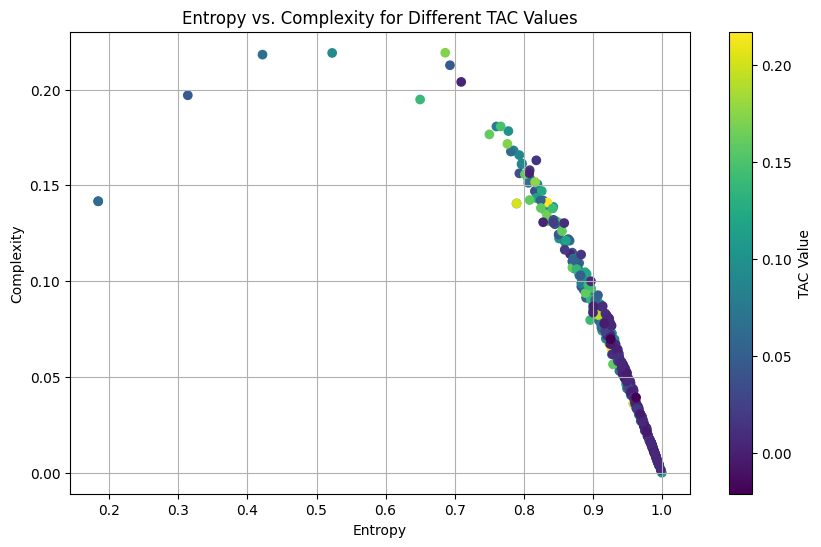

In [42]:
# Creating empty lists to store entropy, complexity, and TAC values
feature_used = []
entropy_values = []
complexity_values = []
tac_values = []

# We will iterate over unique TAC values to get entropy and complexity values for the particular TAC value
for tac_value in merged_df['TAC_Reading'].unique():
    # Slicing the dataset based on the current TAC value
    subset_df = merged_df[merged_df['TAC_Reading'] == tac_value]

    for feature in ['z', 'y', 'x']:
        ordinal_patterns_values = ordinal_patterns(subset_df[feature], embdim=3, embdelay=1)

        feature_inuse = feature
        entropy_value = p_entropy(ordinal_patterns_values)
        complexity_value = complexity(ordinal_patterns_values)

        # Appending entropy, complexity, and TAC values to the lists we created at the beginning
        feature_used.append(feature_inuse)
        entropy_values.append(entropy_value)
        complexity_values.append(complexity_value)
        tac_values.append(tac_value)

# Converting these lists to numpy arrays for plotting
feature_used = np.array(feature_used)
entropy_values = np.array(entropy_values)
complexity_values = np.array(complexity_values)
tac_values = np.array(tac_values)



plt.figure(figsize=(10, 6))
plt.scatter(entropy_values, complexity_values, c=tac_values, cmap='viridis')
plt.colorbar(label='TAC Value')
plt.xlabel('Entropy')
plt.ylabel('Complexity')
plt.title('Entropy vs. Complexity for Different TAC Values')
plt.grid(True)
plt.show()


In [43]:
# Creating a DataFrame to store entropy, complexity, and TAC values
data = {
    'Feature' : feature_used,
    'Entropy': entropy_values,
    'Complexity': complexity_values,
    'TAC_Value': tac_values
}
df = pd.DataFrame(data)

print(df)

    Feature   Entropy  Complexity  TAC_Value
0         z  0.955894    0.040597   0.032672
1         y  0.897935    0.091054   0.032672
2         x  0.937429    0.062262   0.032672
3         z  0.977233    0.023190   0.069712
4         y  0.911794    0.078343   0.069712
..      ...       ...         ...        ...
472       y  0.941797    0.057849   0.005121
473       x  0.993560    0.006449   0.005121
474       z  0.989350    0.010338   0.005040
475       y  0.971946    0.026475   0.005040
476       x  0.983933    0.015965   0.005040

[477 rows x 4 columns]


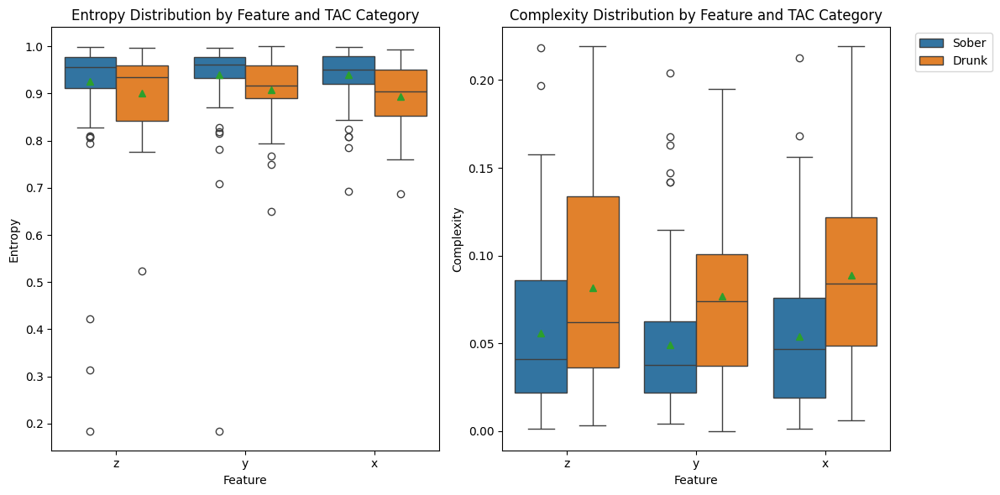

In [44]:

# Adding a new column for TAC category for sober and drunk based on the TAC value for the boxplot
df['TAC_Category'] = ['Sober' if val <= 0.08 else 'Drunk' for val in df['TAC_Value']]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))  # Adjust figsize as needed

# Entropy boxplot
tac_categories = df['TAC_Category'].unique()
sns.boxplot(
    ax=ax1,
    x="Feature",
    y="Entropy",
    hue="TAC_Category",
    showmeans=True,
    legend=False,
    data=df
)
ax1.set_title('Entropy Distribution by Feature and TAC Category')


# Complexity boxplot
sns.boxplot(
    ax=ax2,
    x="Feature",
    y="Complexity",
    hue="TAC_Category",
    showmeans=True,
    data=df
)
ax2.set_title('Complexity Distribution by Feature and TAC Category')

# Create a legend outside the plot
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))

plt.tight_layout()
plt.show()


In [45]:
# Median Entropy values for sober cases tend to be higher than median entropy values for drunk cases
# Median Complexity values for sober cases tend to be lower than median complexity values for drunk cases

In [46]:
# creating sample df1 with value only belonging to pid BK7610
sample_df1 = merged_df[(merged_df['pid'] == 'BK7610')]

<ipython-input-47-599f9c66d111>:6: RuntimeWarning: Second argument 'x' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  ax[0].plot(t,"x",data=sample_df1)
<ipython-input-47-599f9c66d111>:7: RuntimeWarning: Second argument 'y' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  ax[1].plot(t,"y",data=sample_df1)


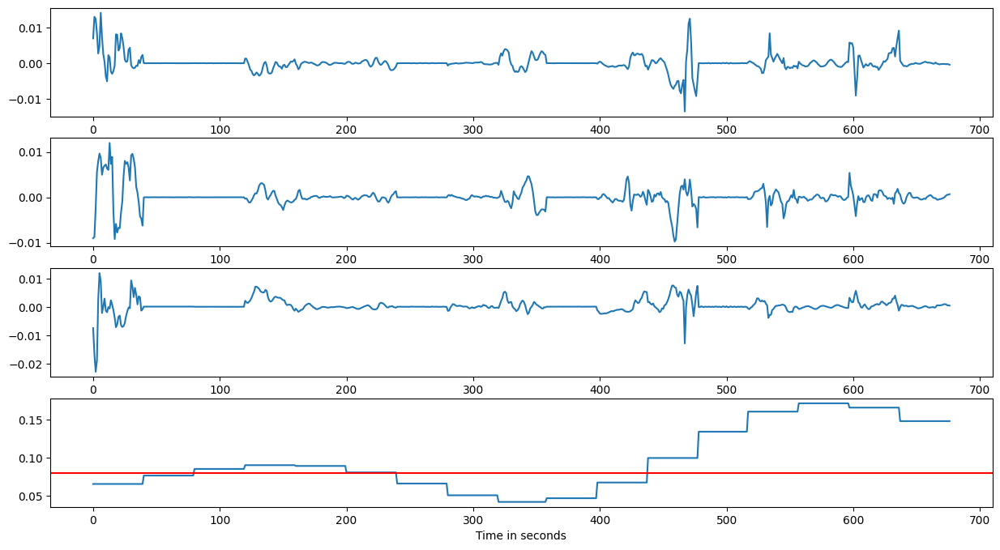

In [47]:
# Sample df having values for pid BK7610 before applying loop over the whole dataset

t=np.arange(sample_df1['x'].size)
fig, ax=plt.subplots(4,figsize=(15,8))
plt.xlabel("Time in seconds")
ax[0].plot(t,"x",data=sample_df1)
ax[1].plot(t,"y",data=sample_df1)
ax[2].plot(t,"z",data=sample_df1)
ax[3].plot(t,'TAC_Reading',data=sample_df1)
ax[3].axhline(y=0.08,color='r',linestyle='-')

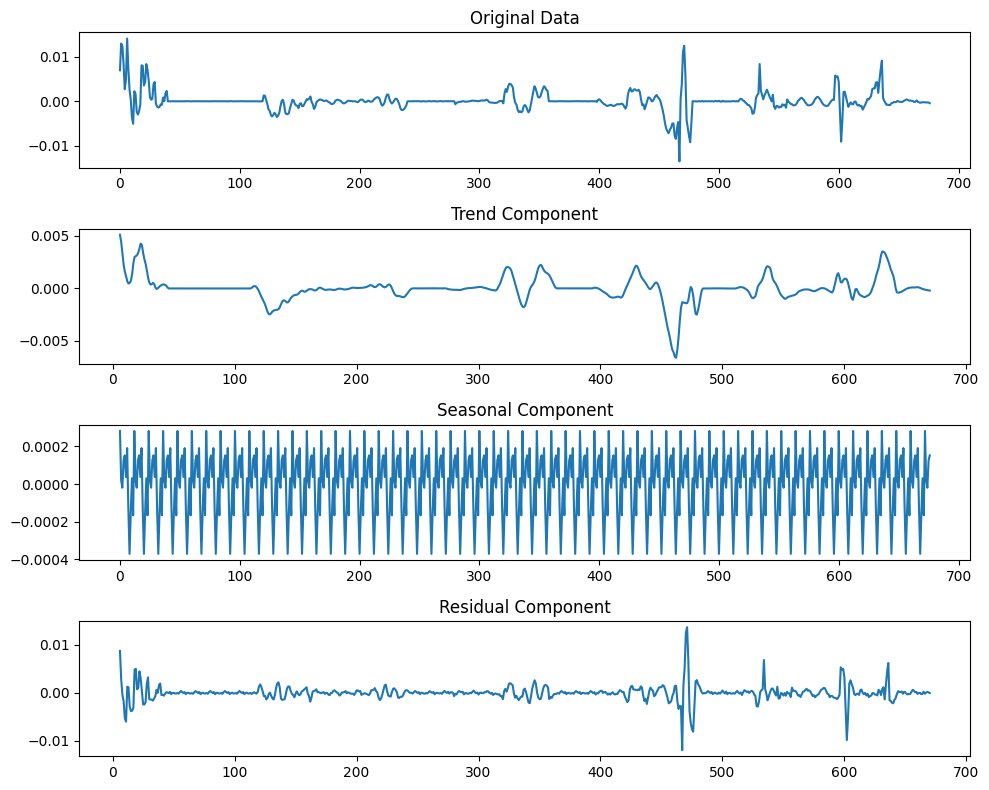

In [48]:
# applying additive decomposition on sample df to check its trend and seasonal component
ts = sample_df1['x']
t = np.arange(sample_df1['x'].size)

# Performing additive decomposition
result = seasonal_decompose(ts, model="additive", period=12)

fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8))

ax1.set_title("Original Data")
ax1.plot(t, ts)

ax2.set_title("Trend Component")
ax2.plot(t, result.trend)

ax3.set_title("Seasonal Component")
ax3.plot(t, result.seasonal)

ax4.set_title("Residual Component")
ax4.plot(t, result.resid)

plt.tight_layout()
plt.show()


In [49]:
# Created sober_df containing values where tac is less than or equal to 0.08(Sober) for sample df
sober_sample_df1 = sample_df1[sample_df1['TAC_Reading'] <= 0.08]

# Created drunk_df containing values where tac is greater than 0.08(Drunk) for sample df
drunk_sample_df1 = sample_df1[sample_df1['TAC_Reading'] > 0.08]


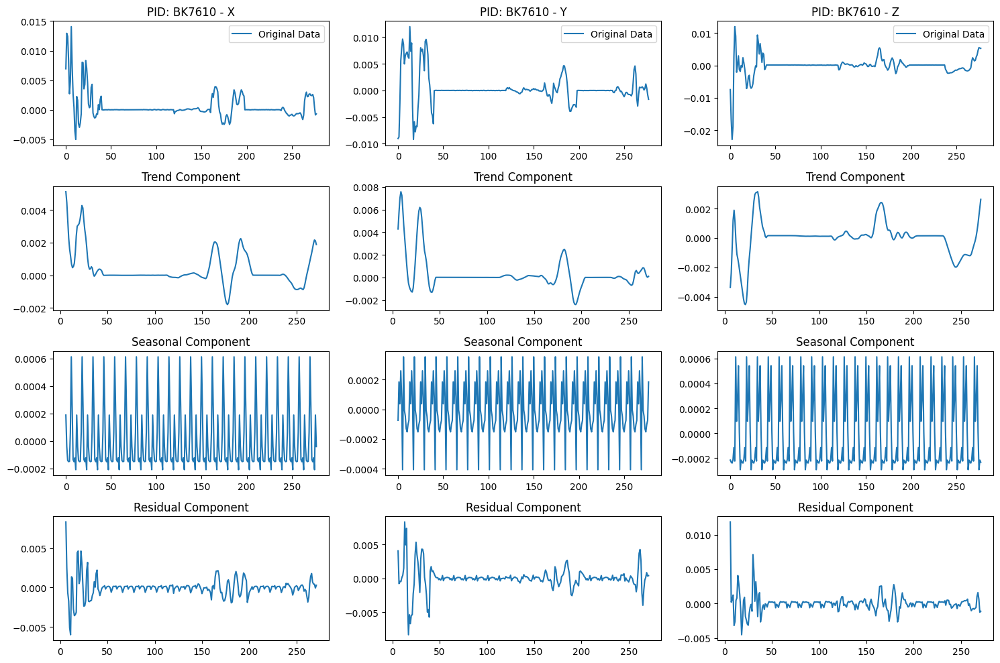

In [51]:
# Now we will perform seasonal decomposition for each acceleration component(sober sample)
components = ['x', 'y', 'z']
fig, axes = plt.subplots(4, len(components), figsize=(15, 10))

for i, component in enumerate(components):
    ts = sober_sample_df1[component]
    t = np.arange(len(ts))  # Custom x-axis
    result = seasonal_decompose(ts, model="additive", period=12)

    axes[0, i].set_title(f"PID: BK7610 - {component.upper()}")
    axes[0, i].plot(t, ts, label='Original Data')
    axes[0, i].legend()

    axes[1, i].set_title("Trend Component")
    axes[1, i].plot(t, result.trend)

    axes[2, i].set_title("Seasonal Component")
    axes[2, i].plot(t, result.seasonal)

    axes[3, i].set_title("Residual Component")
    axes[3, i].plot(t, result.resid)

plt.tight_layout()
plt.show()

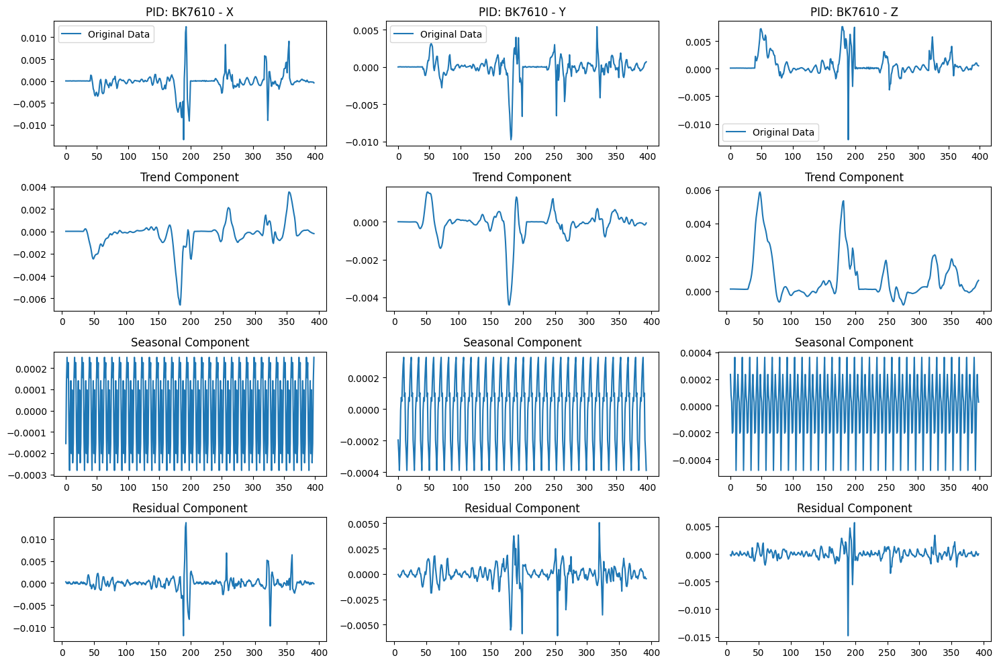

In [52]:
# Performing seasonal decomposition for each acceleration component(drunk sample)
components = ['x', 'y', 'z']
fig, axes = plt.subplots(4, len(components), figsize=(15, 10))

for i, component in enumerate(components):
    ts = drunk_sample_df1[component]
    t = np.arange(len(ts))  # Custom x-axis
    result = seasonal_decompose(ts, model="additive", period=12)

    axes[0, i].set_title(f"PID: BK7610 - {component.upper()}")
    axes[0, i].plot(t, ts, label='Original Data')
    axes[0, i].legend()

    axes[1, i].set_title("Trend Component")
    axes[1, i].plot(t, result.trend)

    axes[2, i].set_title("Seasonal Component")
    axes[2, i].plot(t, result.seasonal)

    axes[3, i].set_title("Residual Component")
    axes[3, i].plot(t, result.resid)

plt.tight_layout()
plt.show()

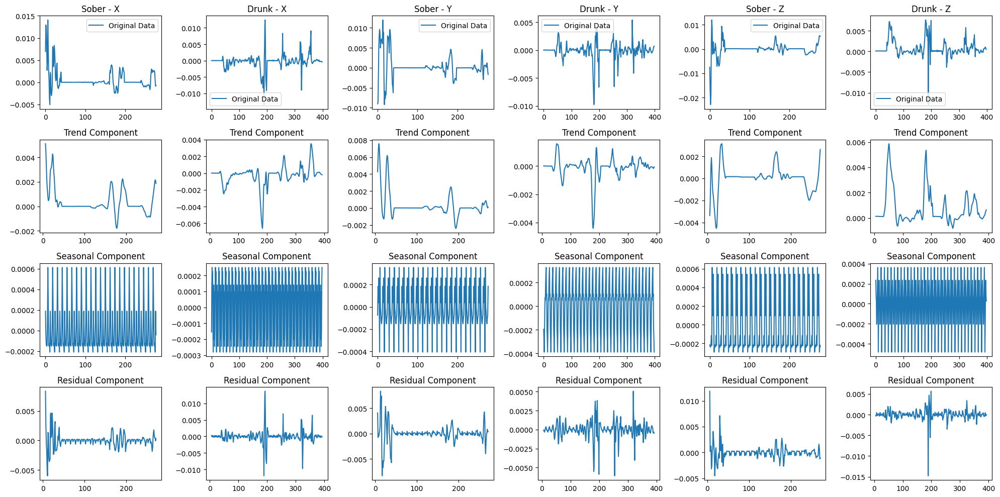

In [54]:
# Now we will to perform seasonal decomposition and plot the components side by side for comparison(sober vs drunk)
def plot_seasonal_decomposition(sober_df, drunk_df):
    components = ['x', 'y', 'z']
    fig, axes = plt.subplots(4, len(components) * 2, figsize=(20, 10))

    for i, component in enumerate(components):
        ts_sober = sober_df[component]
        t_sober = np.arange(len(ts_sober))
        result_sober = seasonal_decompose(ts_sober, model="additive", period=12)

        # Sober values
        axes[0, 2*i].set_title(f"Sober - {component.upper()}")
        axes[0, 2*i].plot(t_sober, ts_sober, label='Original Data')
        axes[0, 2*i].legend()

        axes[1, 2*i].set_title("Trend Component")
        axes[1, 2*i].plot(t_sober, result_sober.trend)

        axes[2, 2*i].set_title("Seasonal Component")
        axes[2, 2*i].plot(t_sober, result_sober.seasonal)

        axes[3, 2*i].set_title("Residual Component")
        axes[3, 2*i].plot(t_sober, result_sober.resid)

        # Drunk sample
        ts_drunk = drunk_df[component]
        t_drunk = np.arange(len(ts_drunk))
        result_drunk = seasonal_decompose(ts_drunk, model="additive", period=12)

        # Drunk values
        axes[0, 2*i+1].set_title(f"Drunk - {component.upper()}")
        axes[0, 2*i+1].plot(t_drunk, ts_drunk, label='Original Data')
        axes[0, 2*i+1].legend()

        axes[1, 2*i+1].set_title("Trend Component")
        axes[1, 2*i+1].plot(t_drunk, result_drunk.trend)

        axes[2, 2*i+1].set_title("Seasonal Component")
        axes[2, 2*i+1].plot(t_drunk, result_drunk.seasonal)

        axes[3, 2*i+1].set_title("Residual Component")
        axes[3, 2*i+1].plot(t_drunk, result_drunk.resid)

    plt.tight_layout()
    plt.show()

# Calling the function with sober and drunk samples
plot_seasonal_decomposition(sober_sample_df1, drunk_sample_df1)


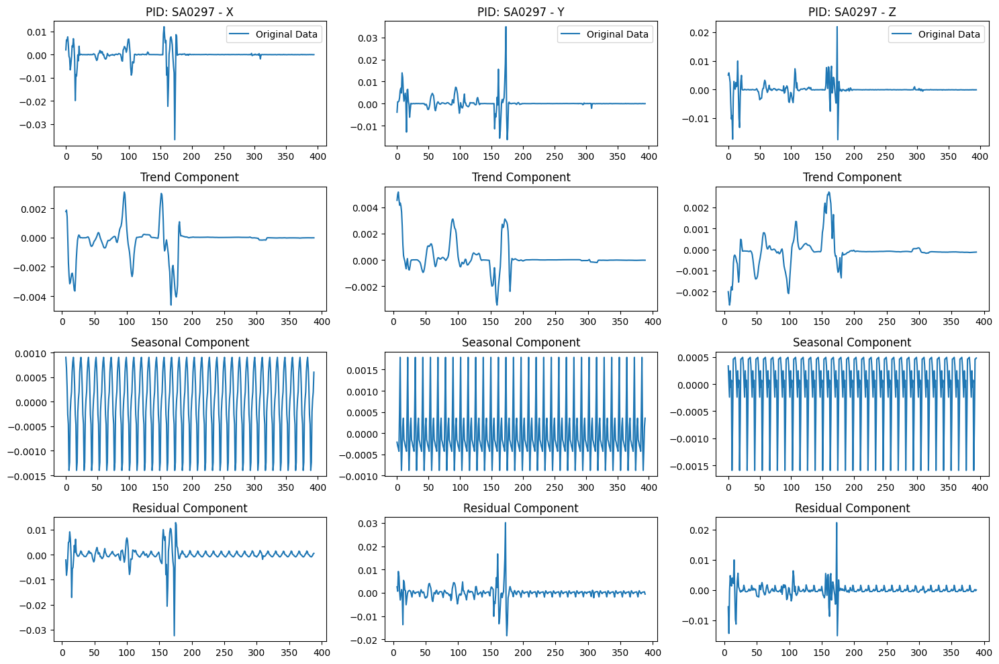

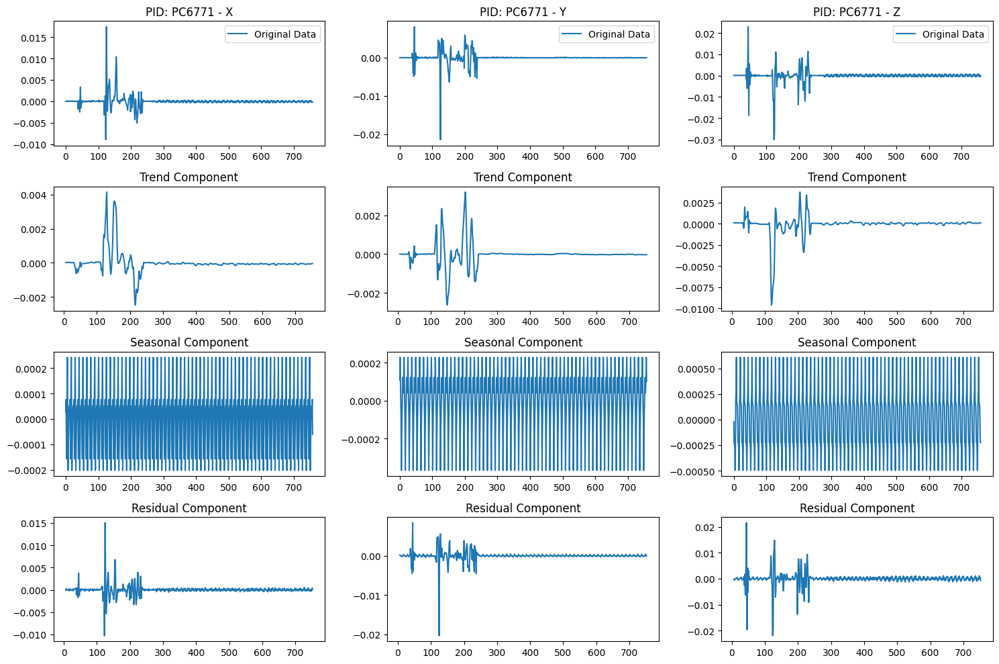

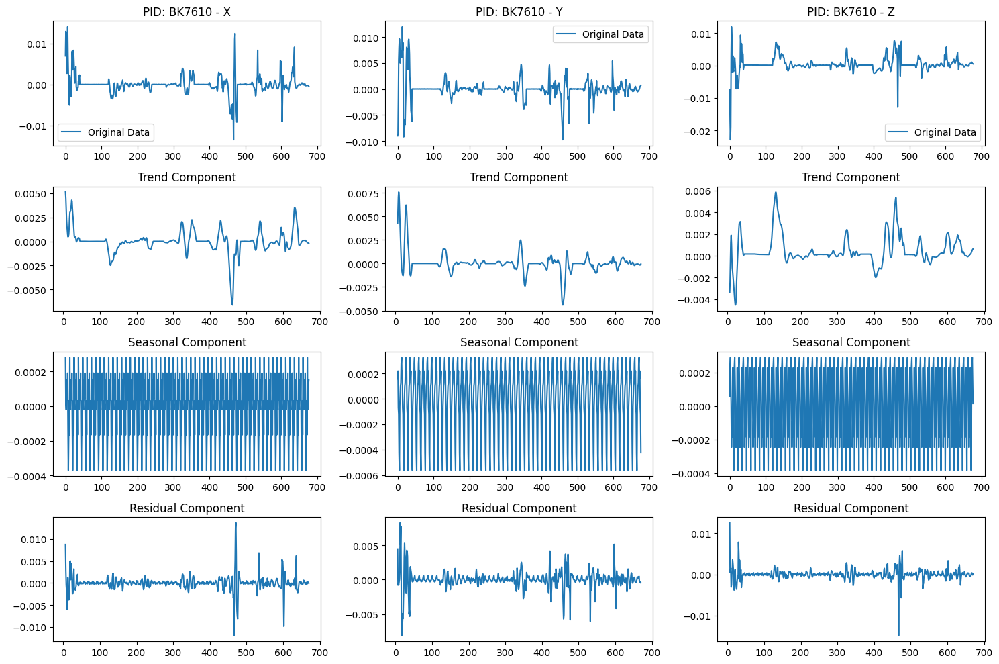

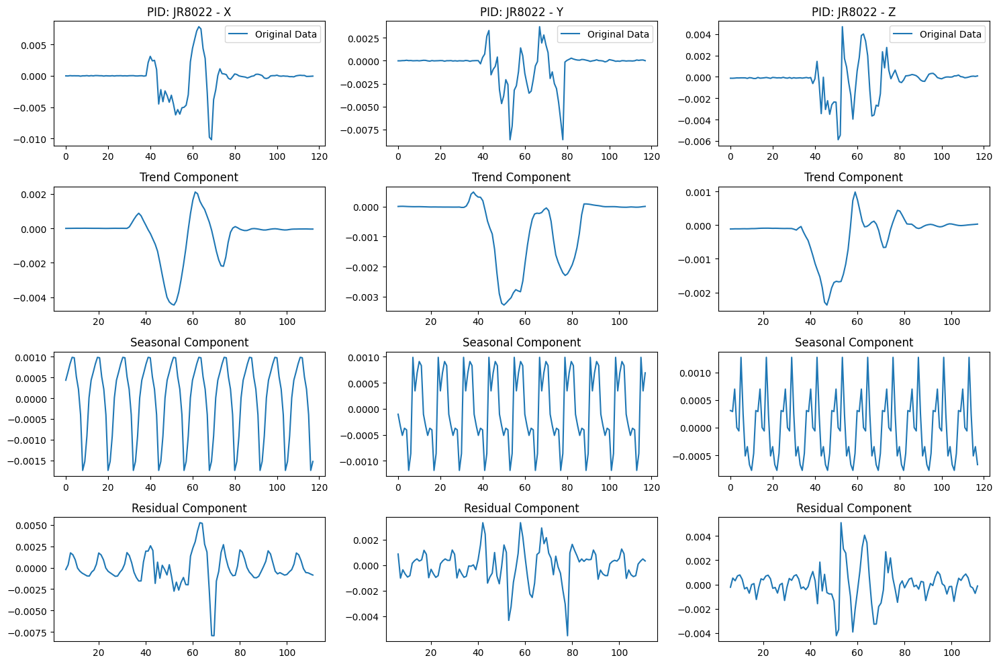

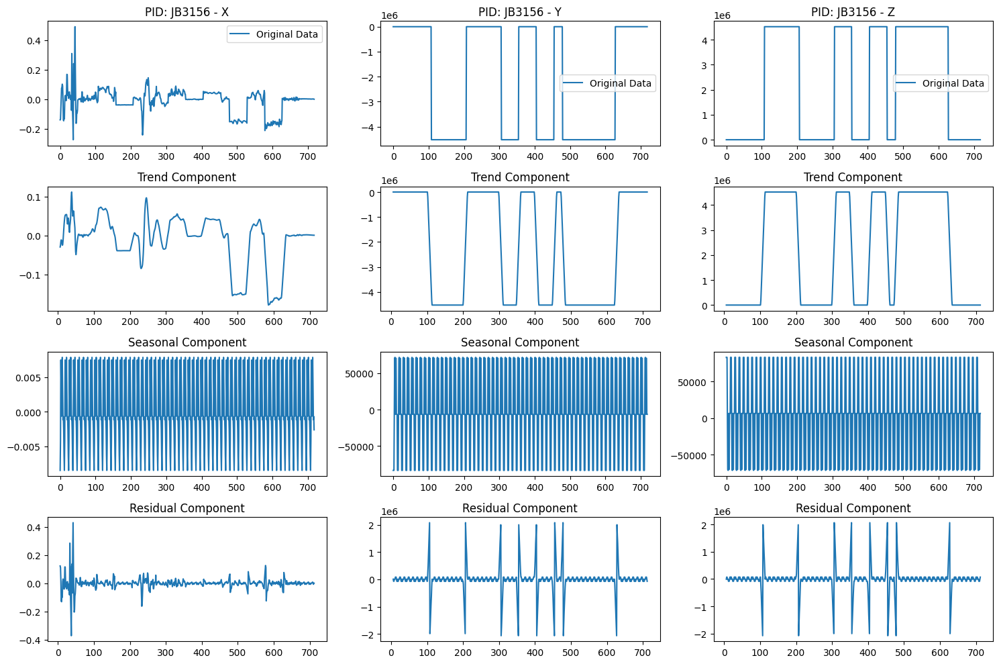

...

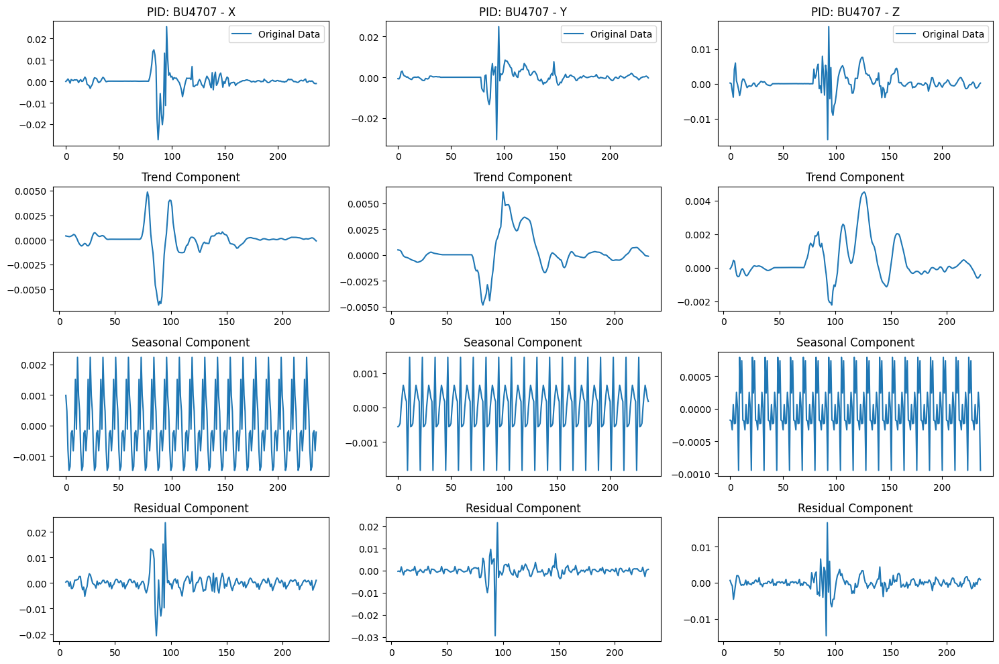

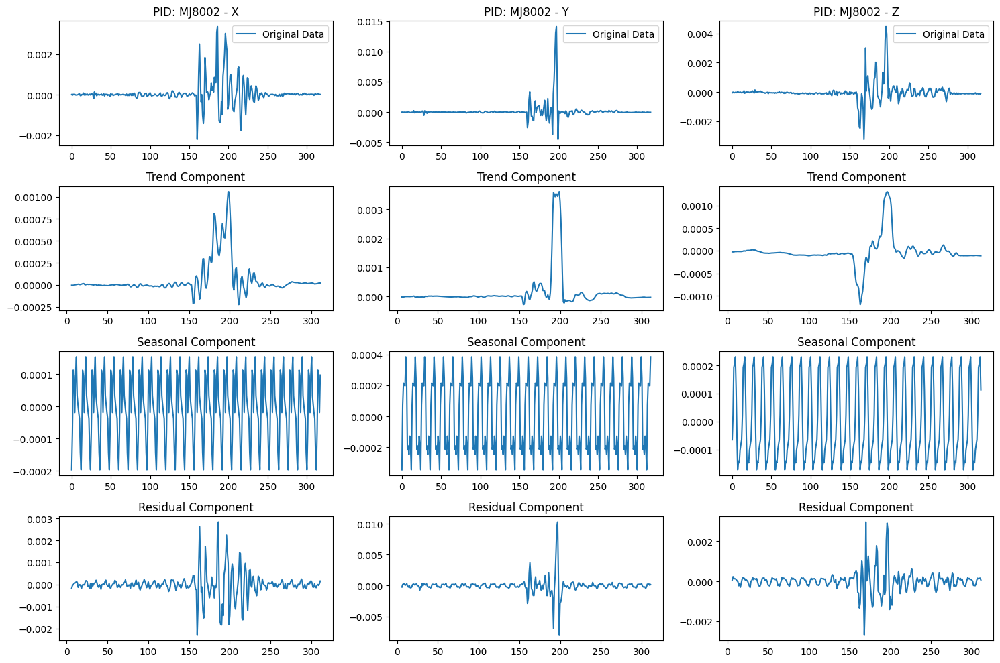

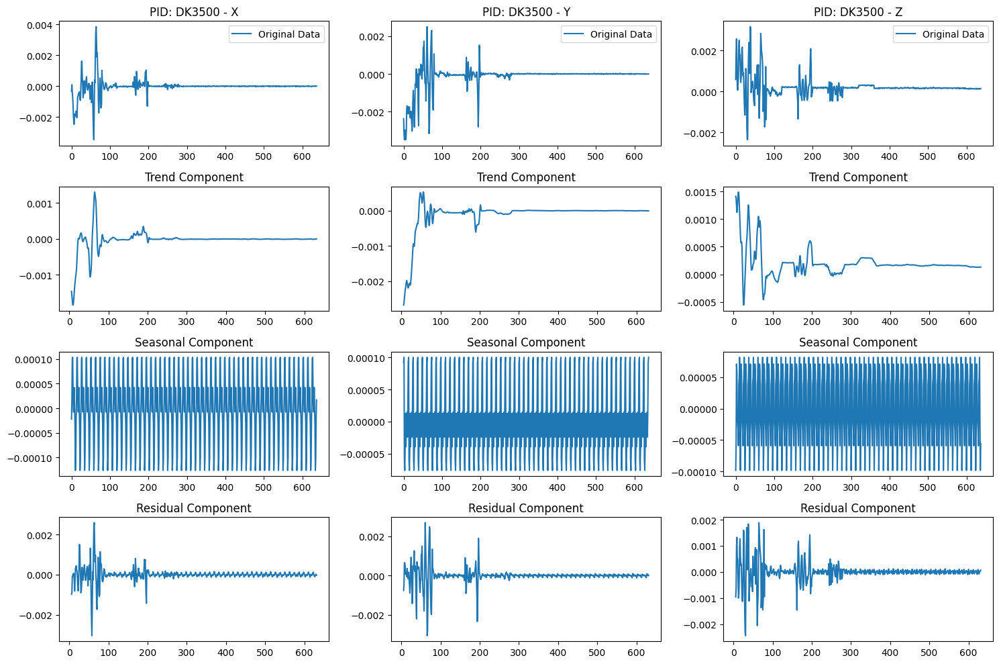

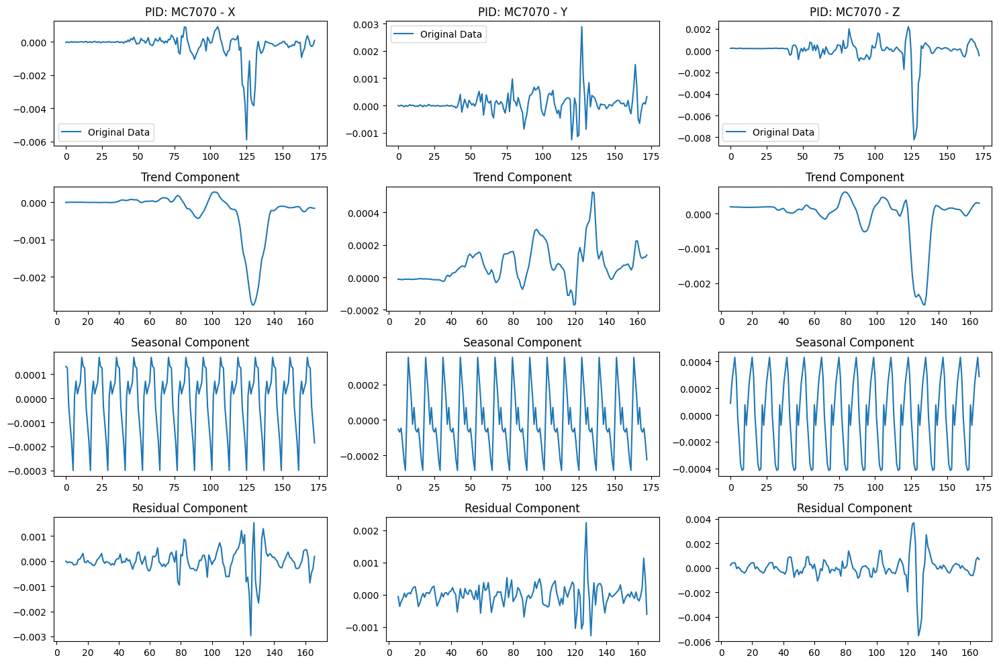

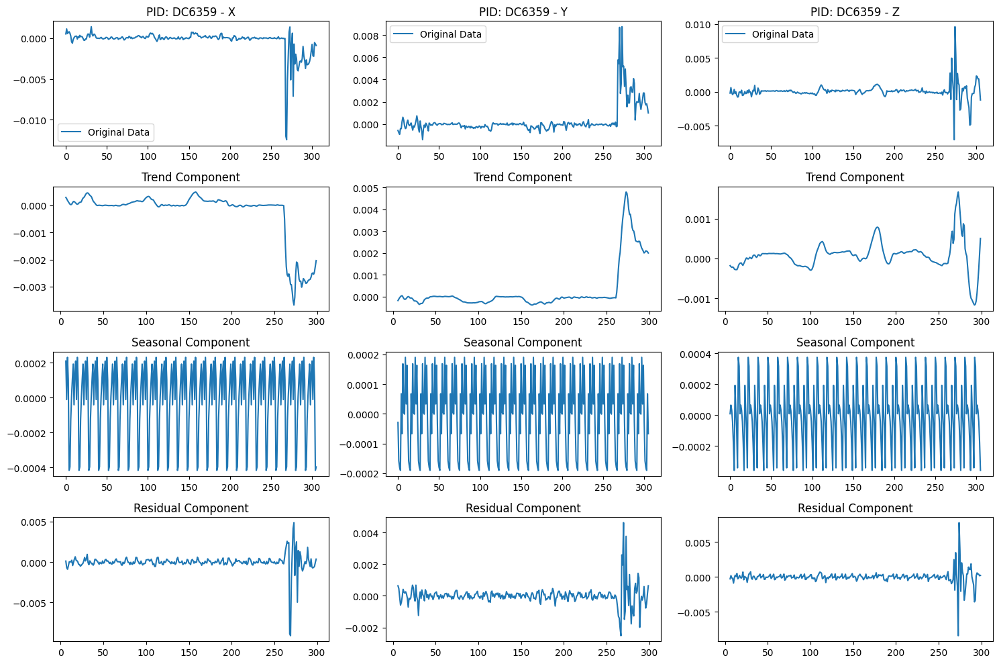

In [55]:
# Get unique PID values
pid_values = merged_df['pid'].unique()

for pid in pid_values:
    # Filtering data for the current PID
    sample_df = merged_df[merged_df['pid'] == pid]

    # Seasonal decomposition for each acceleration component
    components = ['x', 'y', 'z']
    fig, axes = plt.subplots(4, len(components), figsize=(15, 10))

    for i, component in enumerate(components):
        ts = sample_df[component]
        t = np.arange(len(ts))
        result = seasonal_decompose(ts, model="additive", period=12)

        # Plotting original data, trend, seasonal, and residual components
        axes[0, i].set_title(f"PID: {pid} - {component.upper()}")
        axes[0, i].plot(t, ts, label='Original Data')
        axes[0, i].legend()

        axes[1, i].set_title("Trend Component")
        axes[1, i].plot(t, result.trend)

        axes[2, i].set_title("Seasonal Component")
        axes[2, i].plot(t, result.seasonal)

        axes[3, i].set_title("Residual Component")
        axes[3, i].plot(t, result.resid)

    plt.tight_layout()
    plt.show()


In [56]:
# Creating sober_df containing values where tac is less than or equal to 0.08
sober_merged_df = merged_df[merged_df['TAC_Reading'] <= 0.08]

# Creating drunk_df containing values where tac is greater than 0.08
drunk_merged_df = merged_df[merged_df['TAC_Reading'] > 0.08]


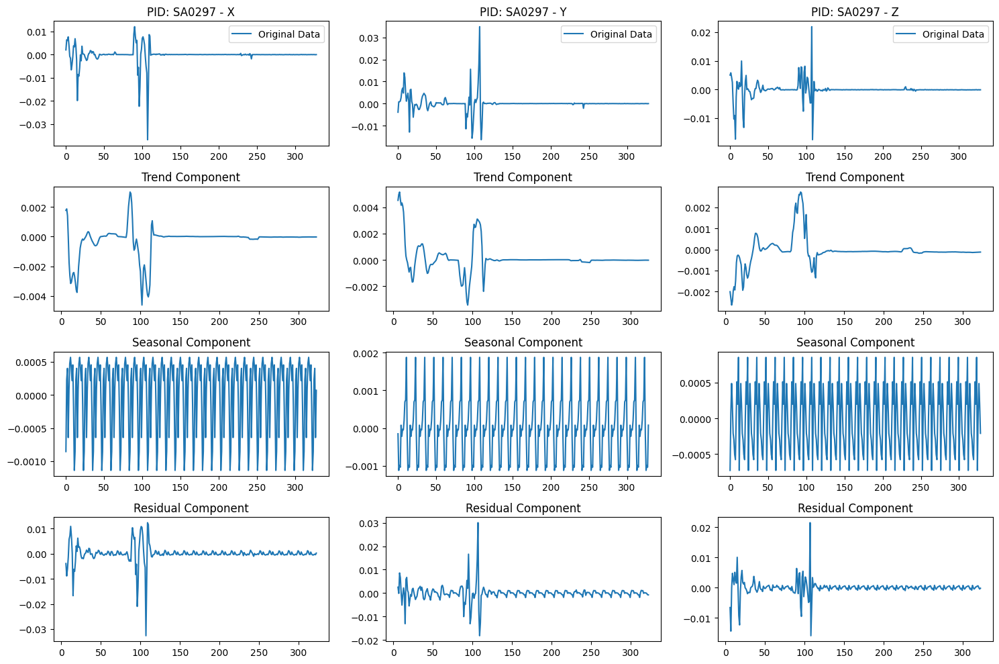

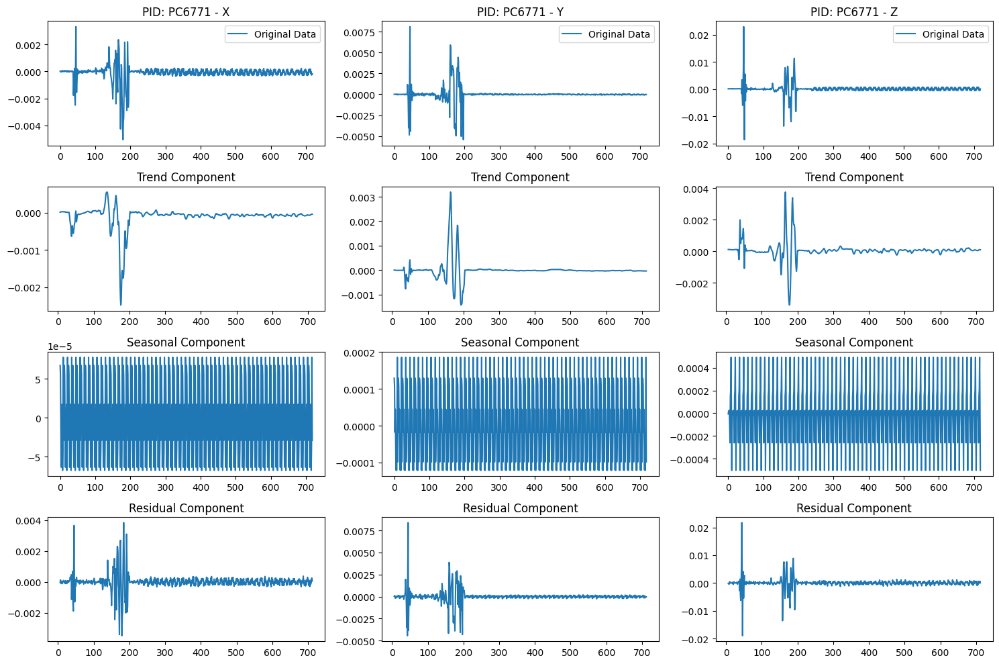

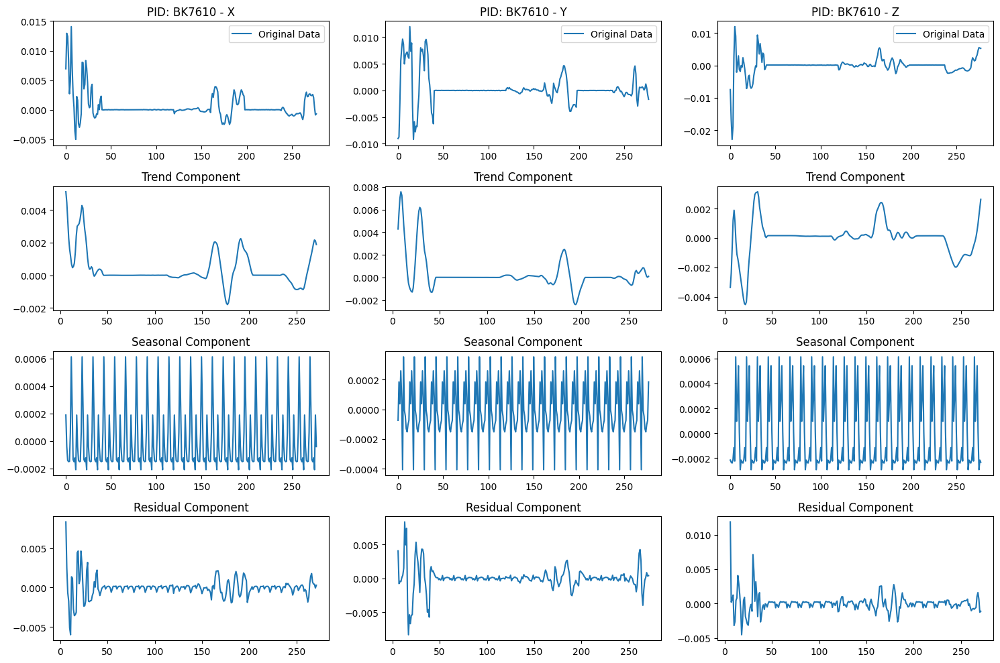

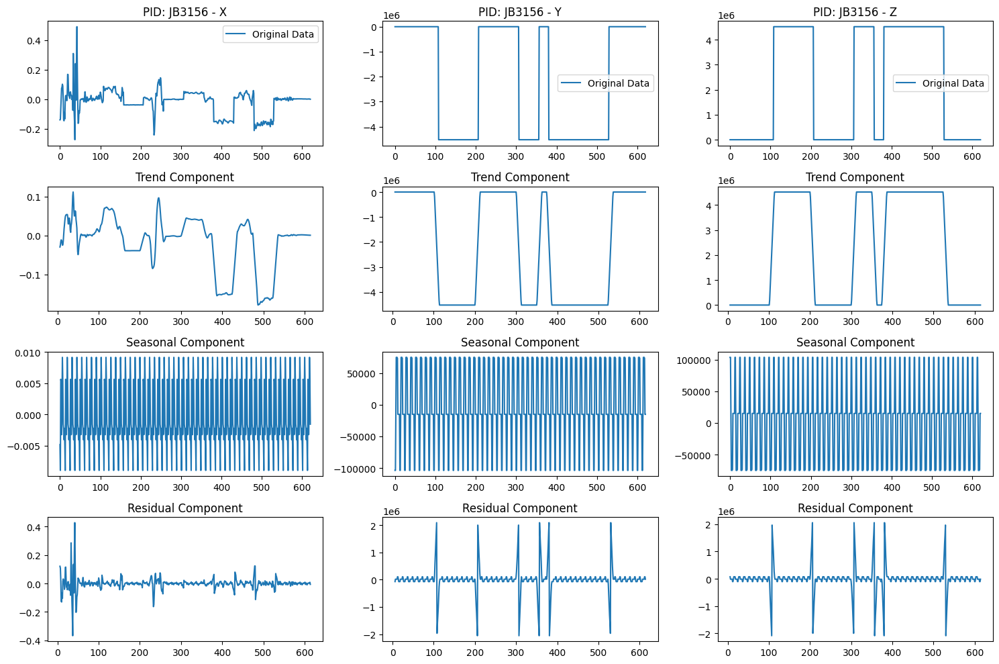

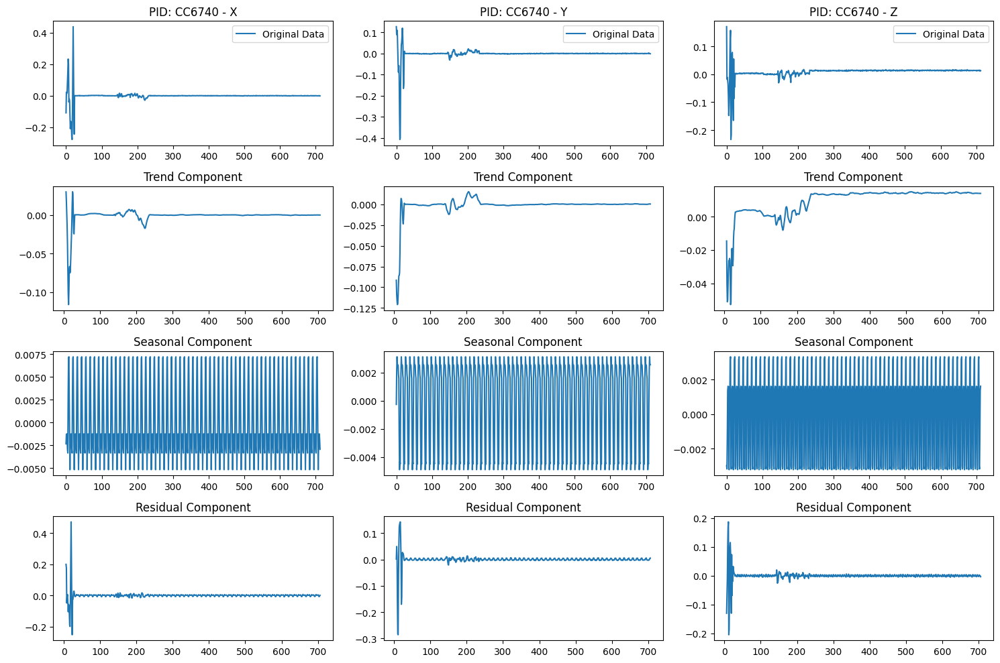

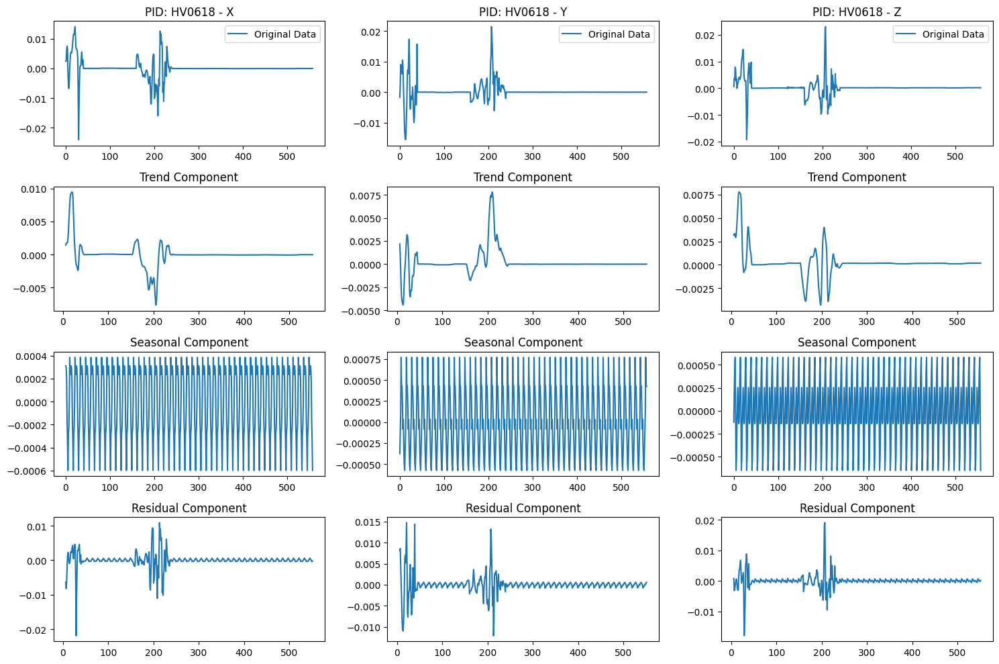

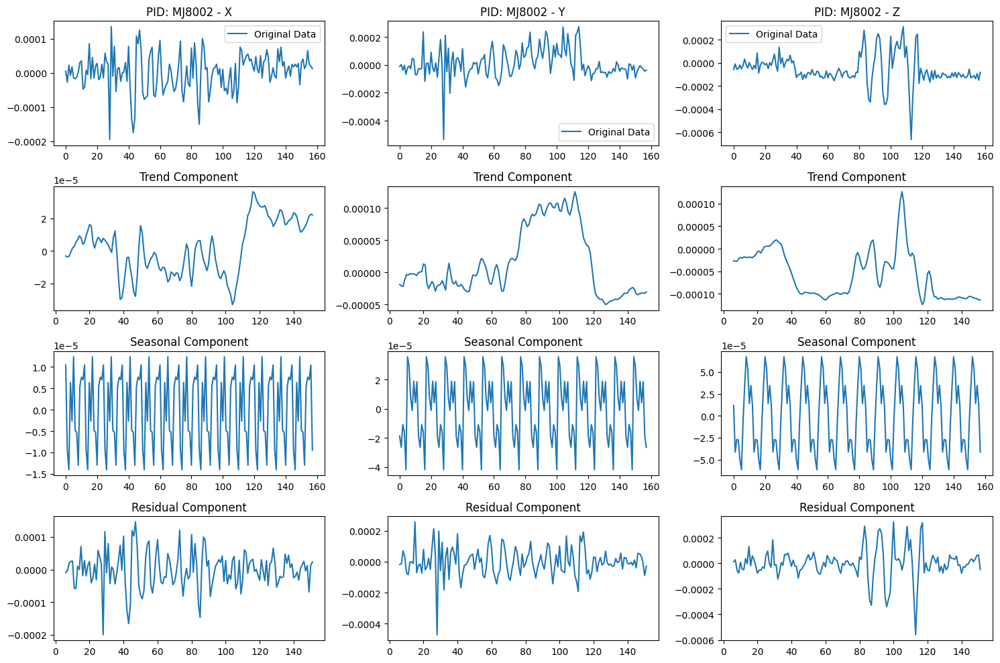

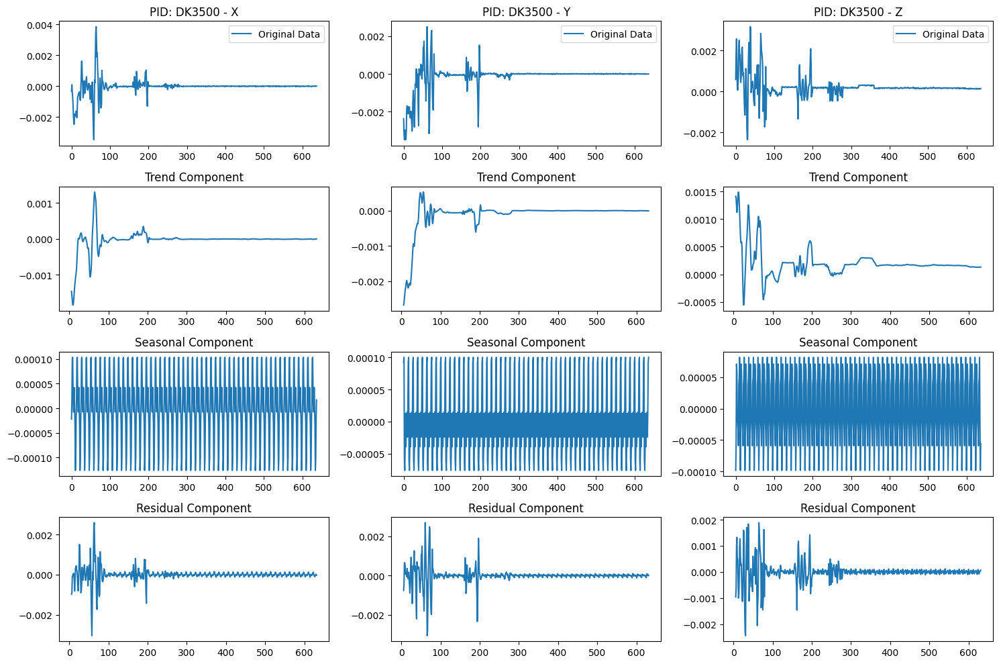

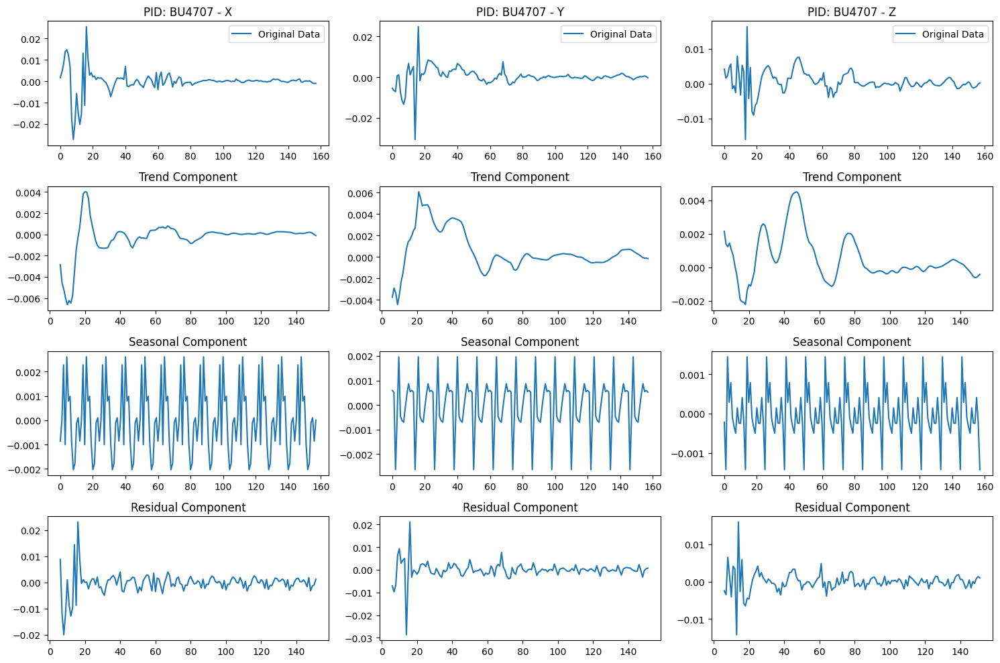

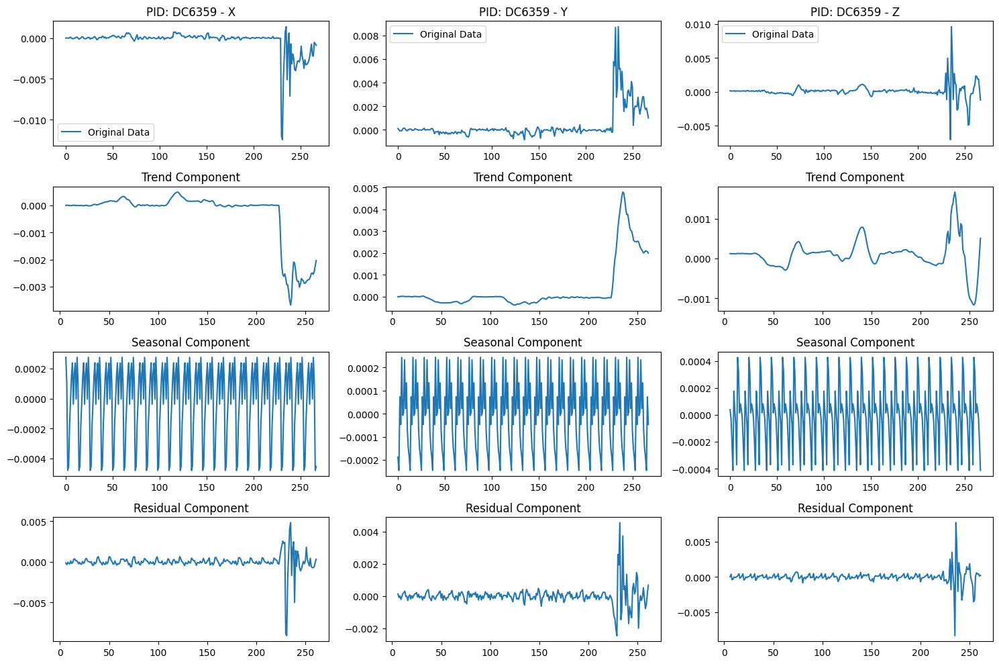

In [57]:
# Plotting the same charts as above but now for sober values
pid_values = sober_merged_df['pid'].unique()

for pid in pid_values:
    sample_df = sober_merged_df[sober_merged_df['pid'] == pid]

    components = ['x', 'y', 'z']
    fig, axes = plt.subplots(4, len(components), figsize=(15, 10))

    for i, component in enumerate(components):
        ts = sample_df[component]
        t = np.arange(len(ts))
        result = seasonal_decompose(ts, model="additive", period=12)

        # Plot original data, trend, seasonal, and residual components
        axes[0, i].set_title(f"PID: {pid} - {component.upper()}")
        axes[0, i].plot(t, ts, label='Original Data')
        axes[0, i].legend()

        axes[1, i].set_title("Trend Component")
        axes[1, i].plot(t, result.trend)

        axes[2, i].set_title("Seasonal Component")
        axes[2, i].plot(t, result.seasonal)

        axes[3, i].set_title("Residual Component")
        axes[3, i].plot(t, result.resid)

    plt.tight_layout()
    plt.show()

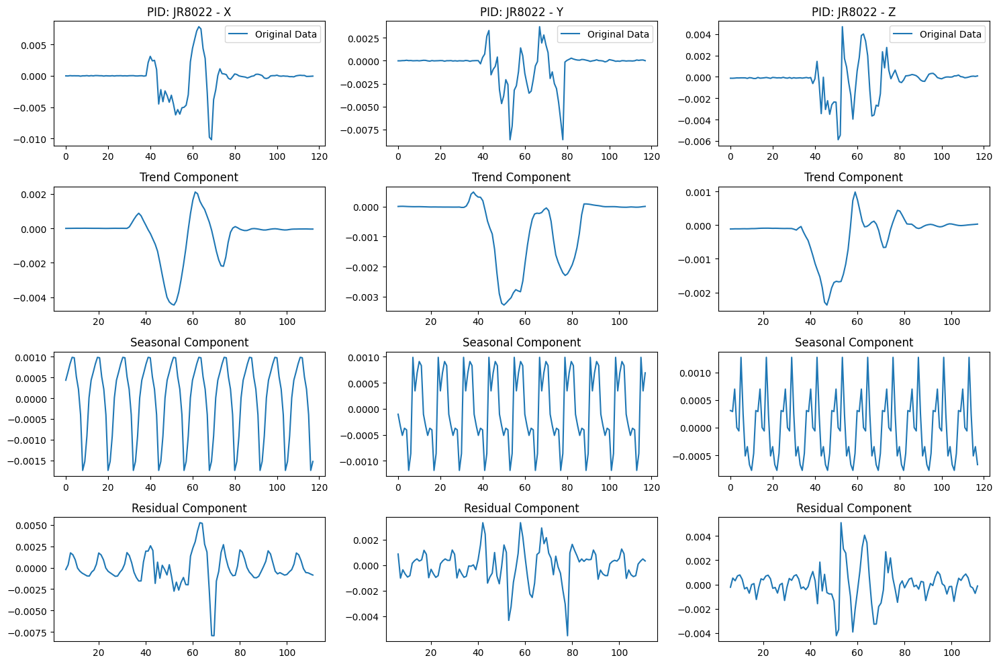

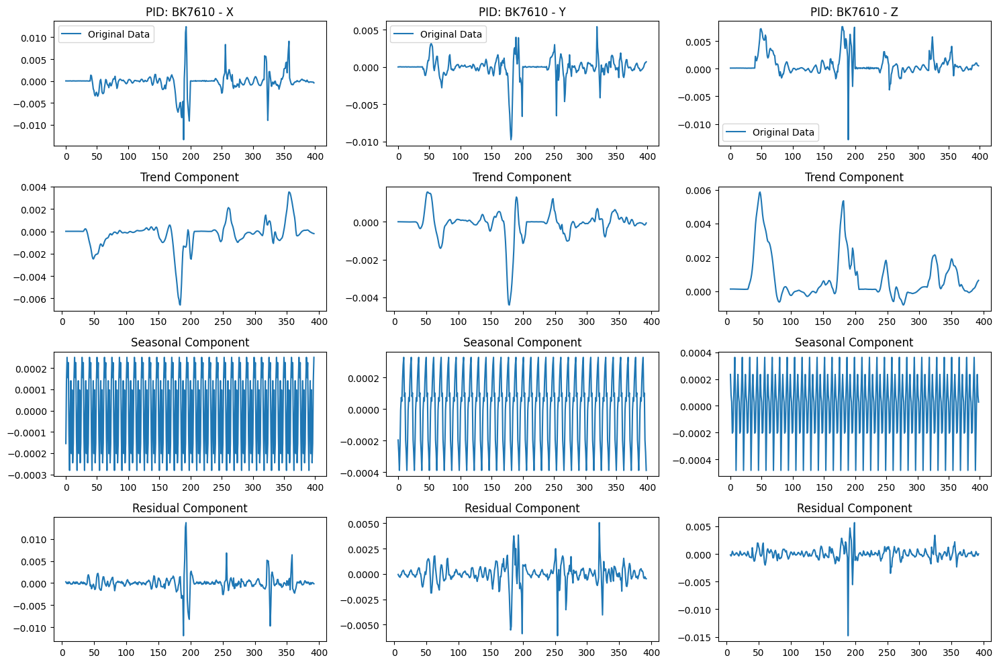

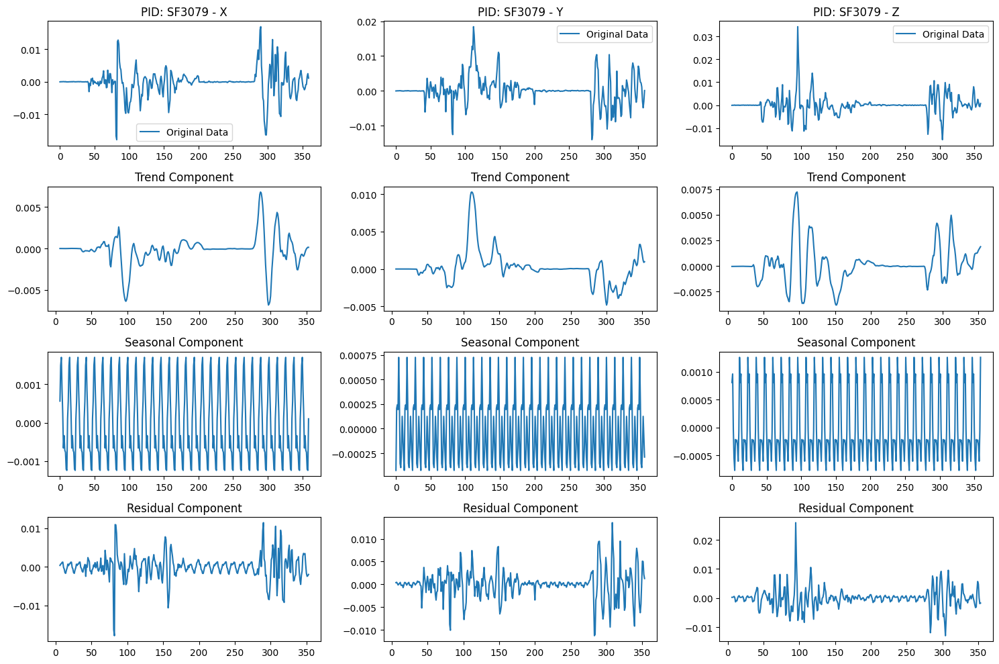

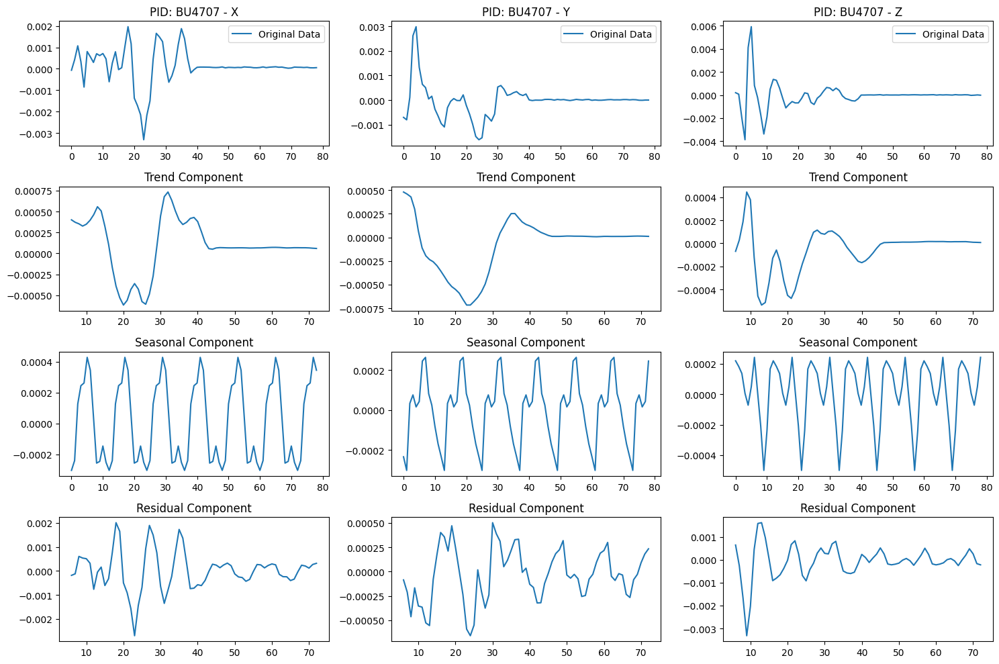

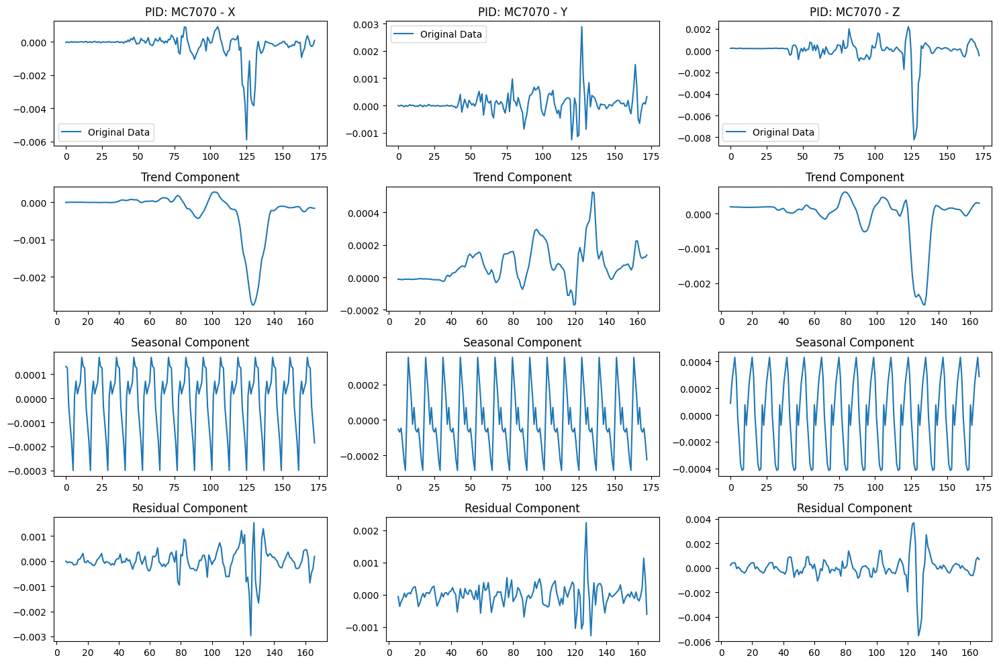

...

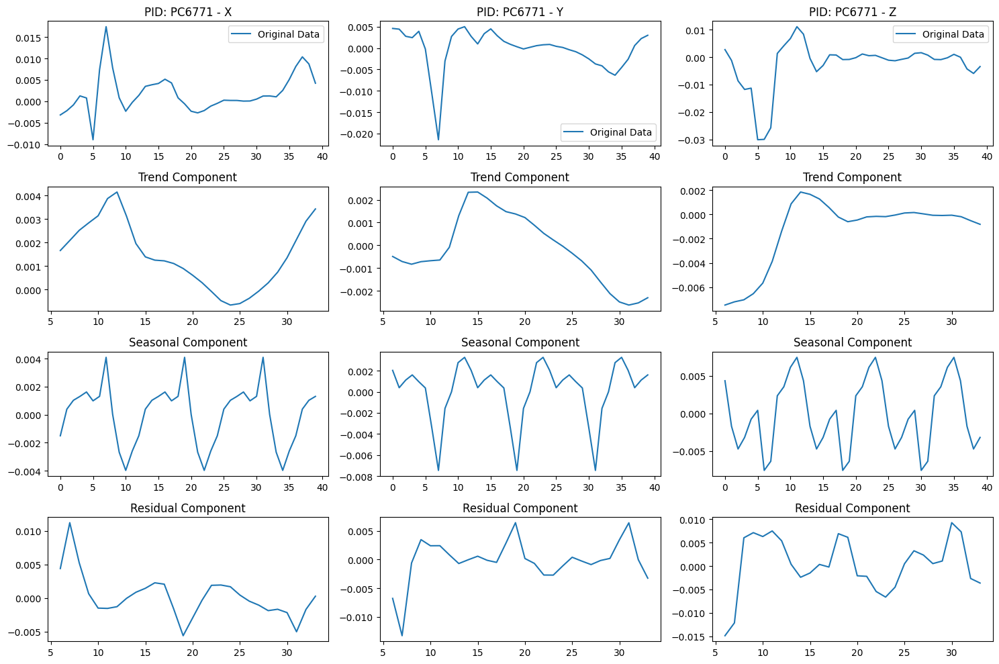

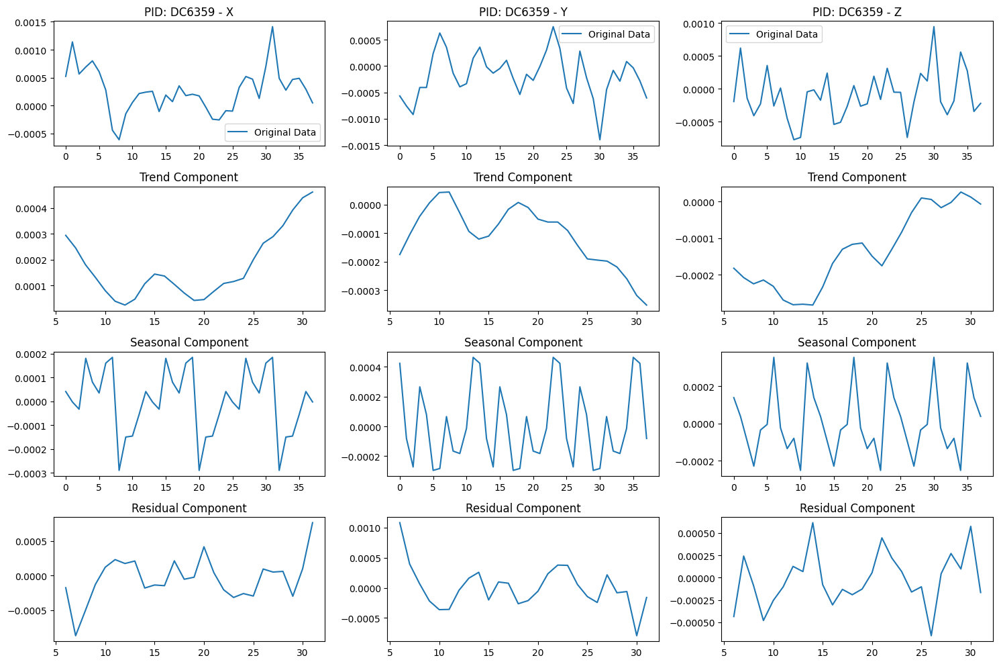

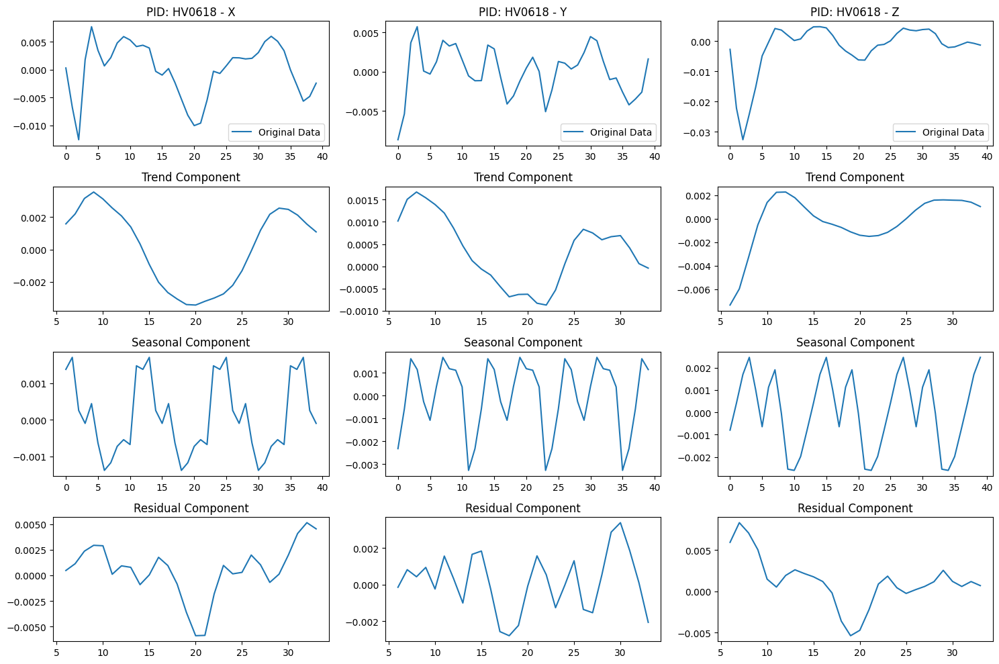

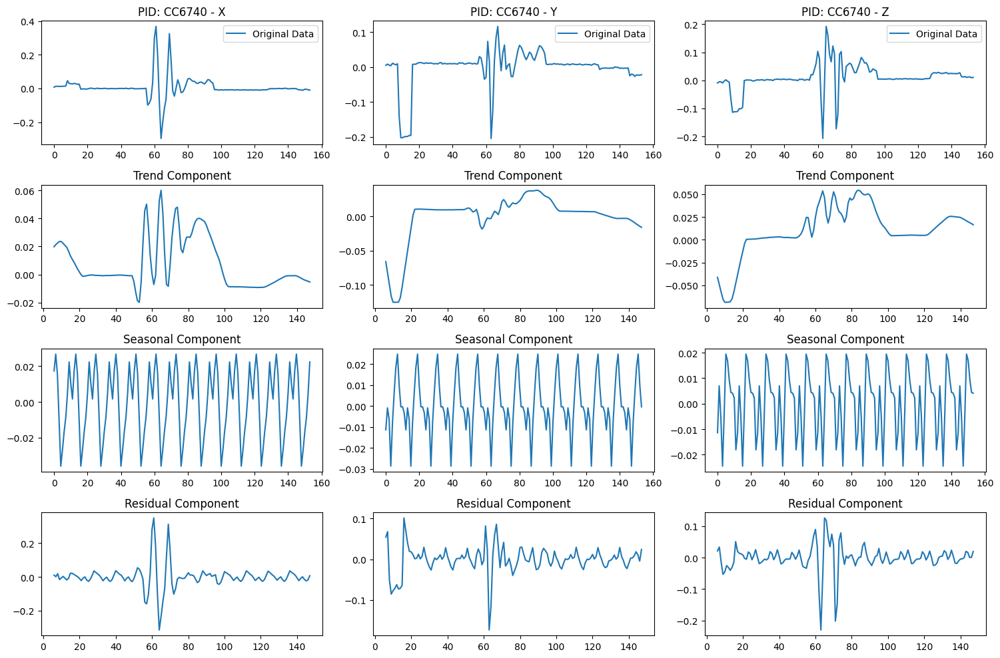

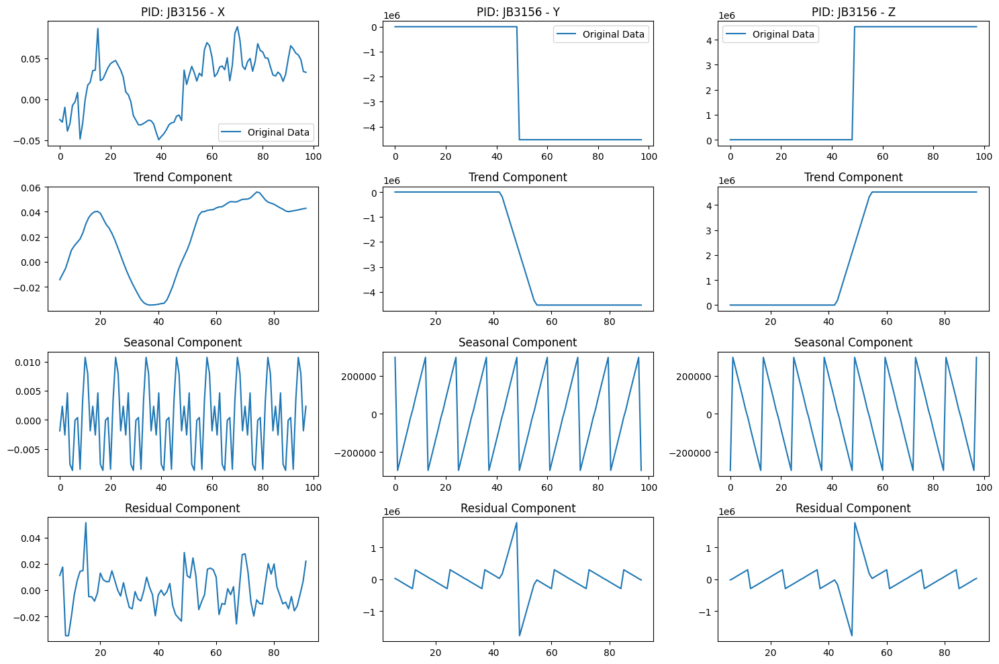

In [58]:
# Plotting the same charts as above but now for drunk values
pid_values = drunk_merged_df['pid'].unique()

for pid in pid_values:
    sample_df = drunk_merged_df[drunk_merged_df['pid'] == pid]

    components = ['x', 'y', 'z']
    fig, axes = plt.subplots(4, len(components), figsize=(15, 10))

    for i, component in enumerate(components):
        ts = sample_df[component]
        t = np.arange(len(ts))
        result = seasonal_decompose(ts, model="additive", period=12)

        # Plot original data, trend, seasonal, and residual components
        axes[0, i].set_title(f"PID: {pid} - {component.upper()}")
        axes[0, i].plot(t, ts, label='Original Data')
        axes[0, i].legend()

        axes[1, i].set_title("Trend Component")
        axes[1, i].plot(t, result.trend)

        axes[2, i].set_title("Seasonal Component")
        axes[2, i].plot(t, result.seasonal)

        axes[3, i].set_title("Residual Component")
        axes[3, i].plot(t, result.resid)

    plt.tight_layout()
    plt.show()


<ipython-input-59-6e8072f24873>:9: RuntimeWarning: Second argument 'x' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[0].plot(t, "x", data=sample_df)
<ipython-input-59-6e8072f24873>:10: RuntimeWarning: Second argument 'y' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[1].plot(t, "y", data=sample_df)


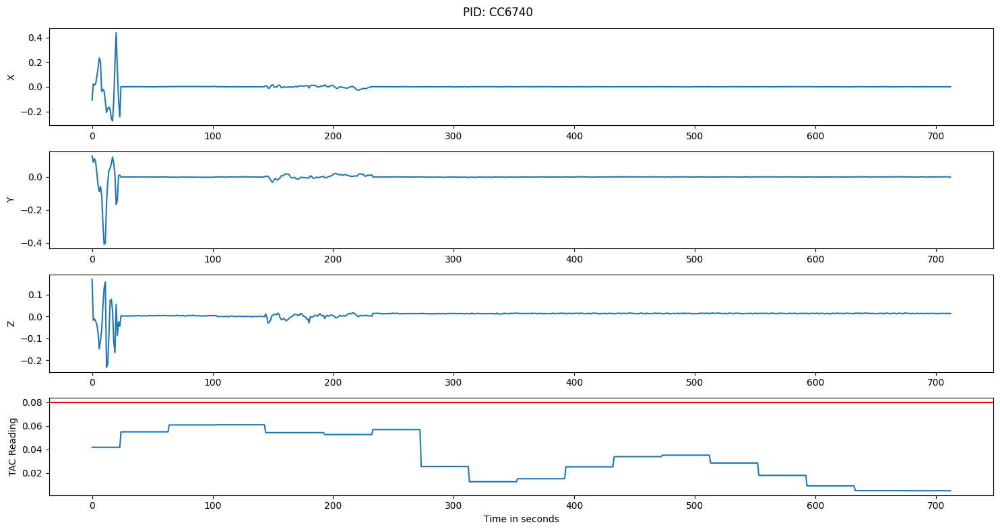

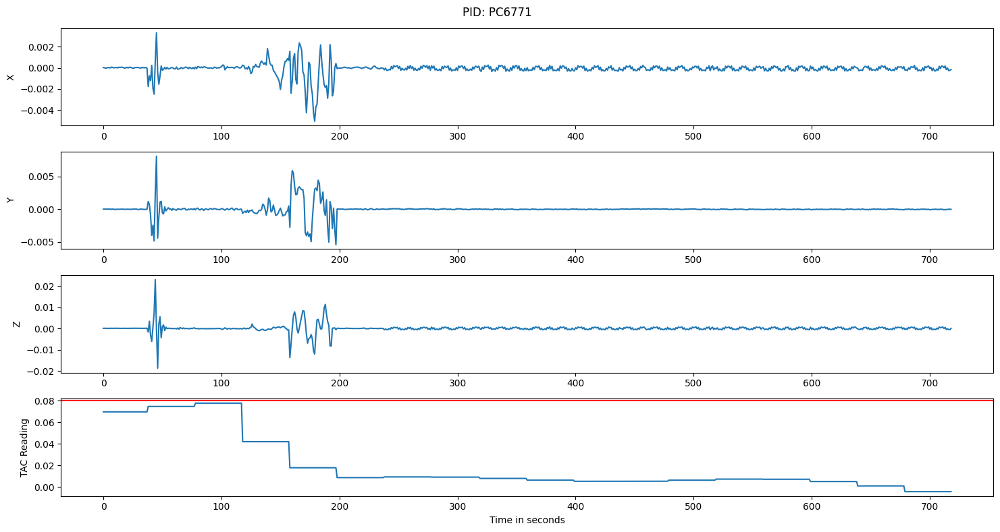

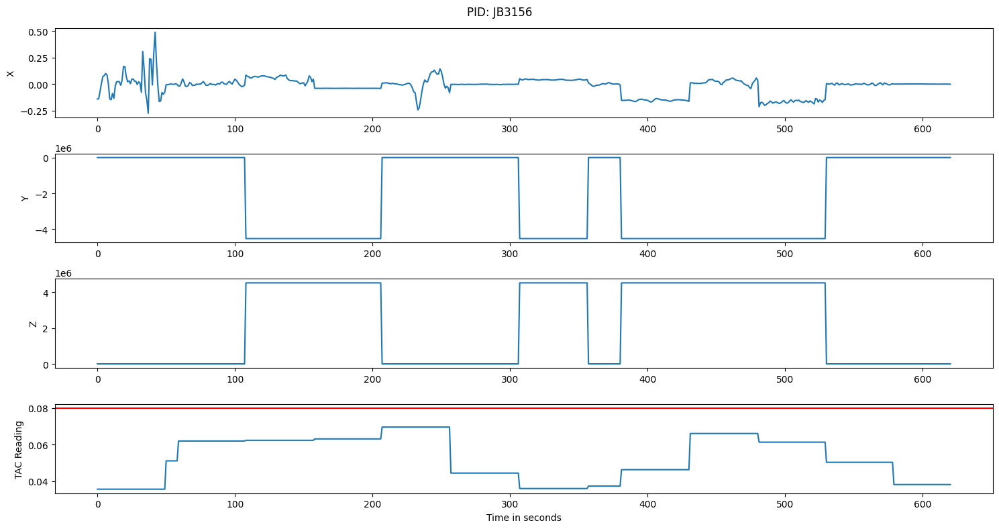

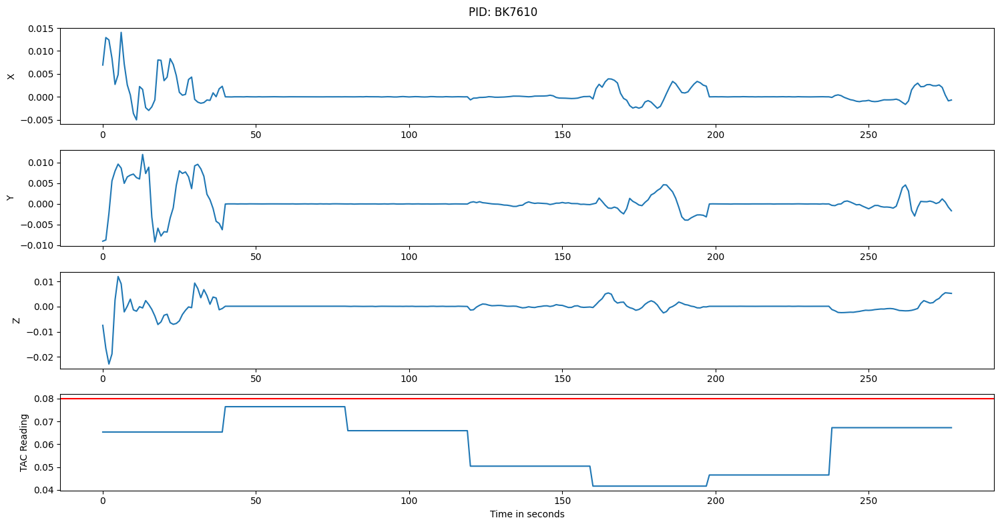

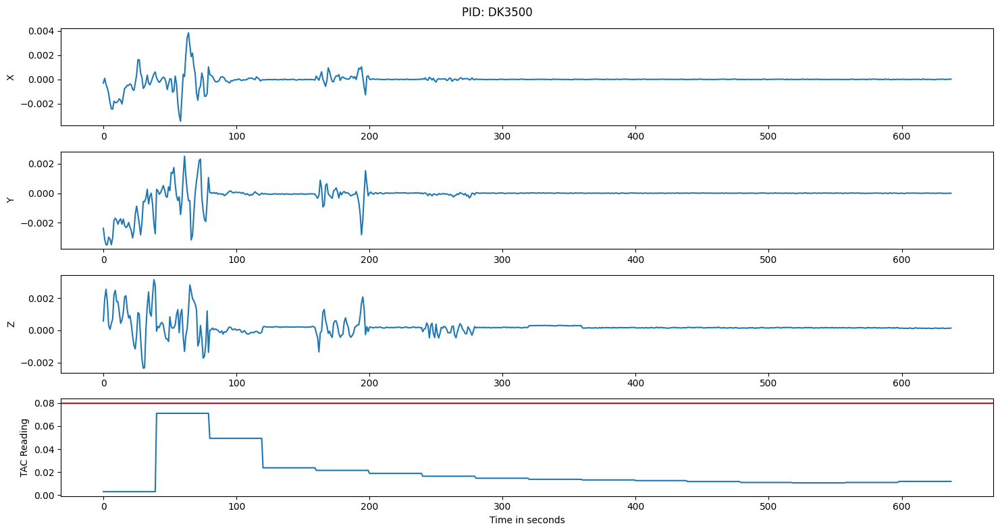

...

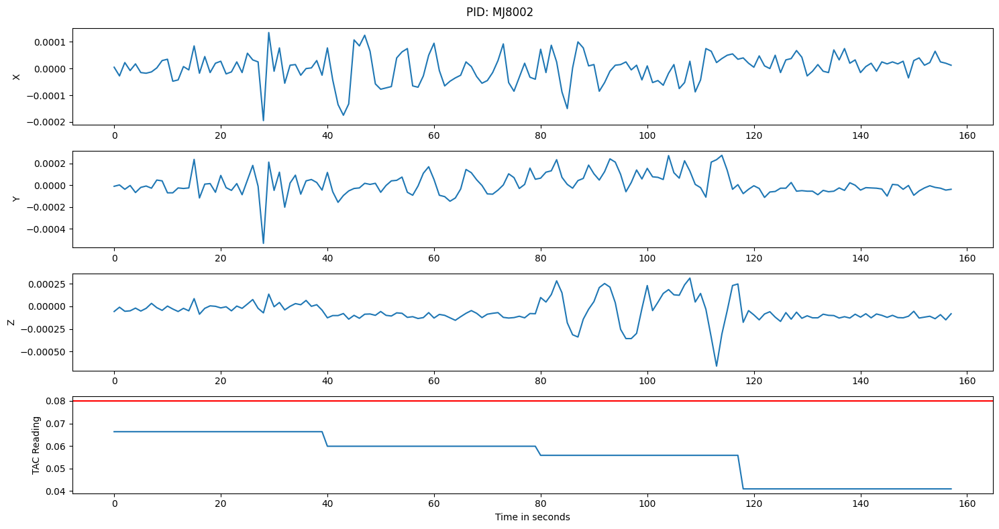

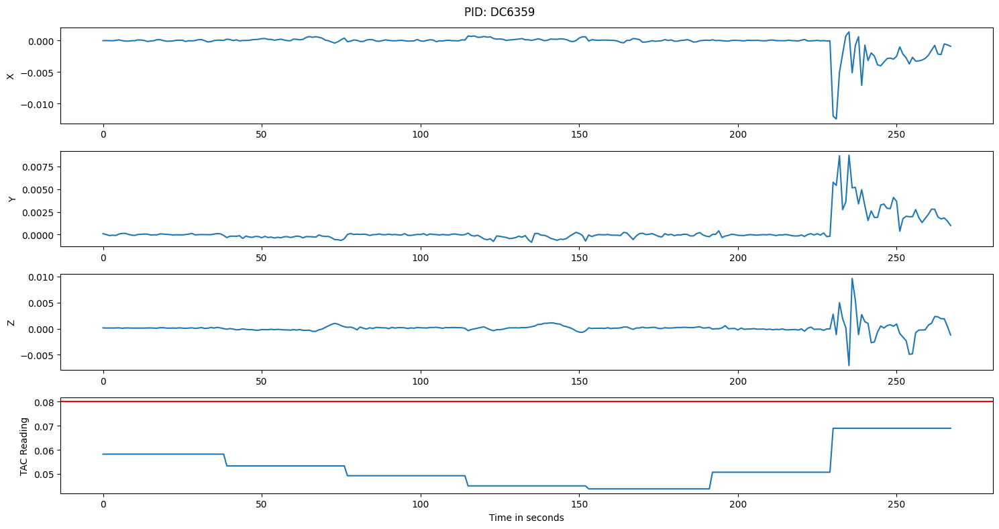

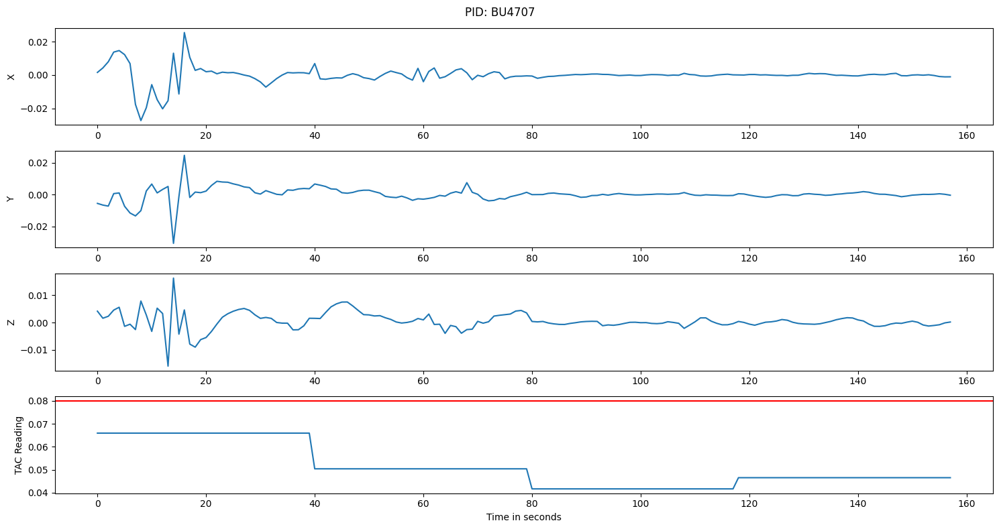

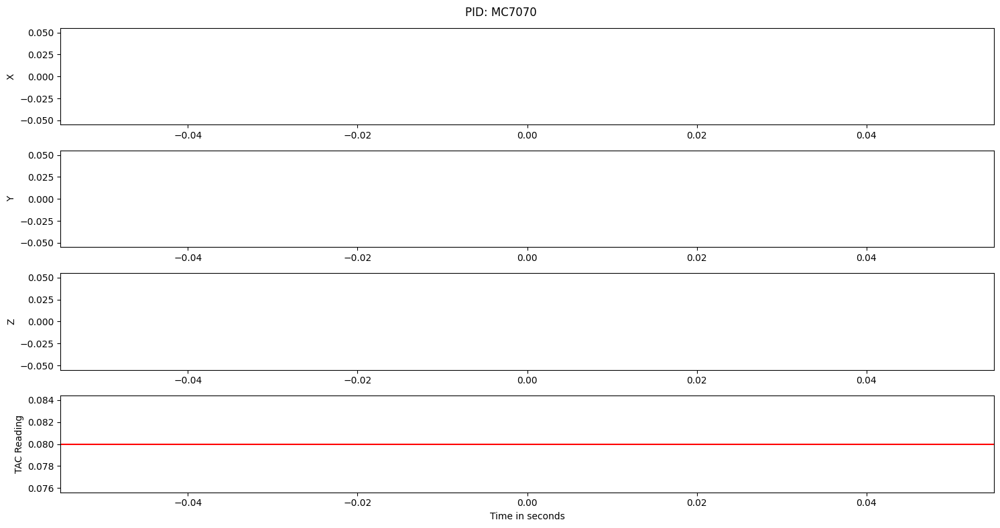

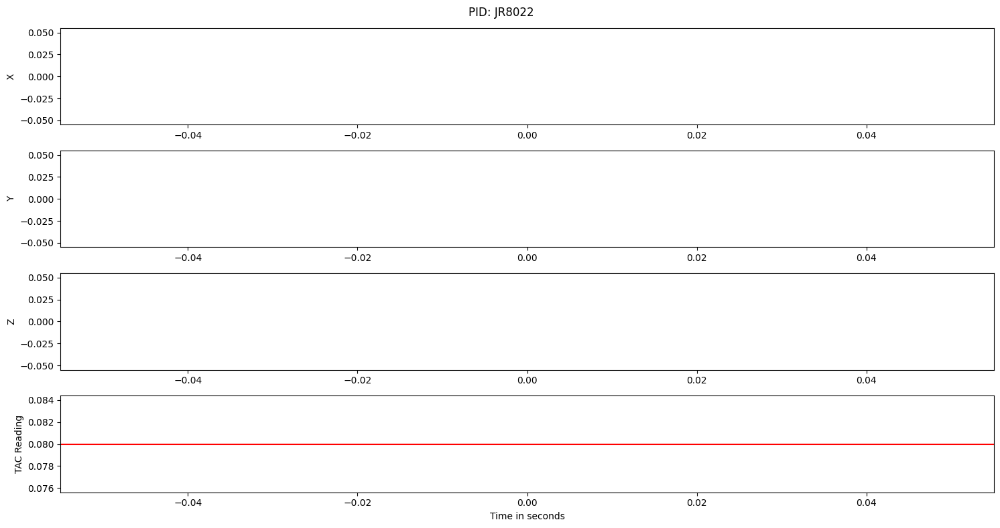

In [59]:
# Checking for each PID value what is the acceleration in x,y,z direction and the corresponding TAC level but for sober values

for x in index_values:
    sample_df = sober_merged_df[(sober_merged_df['pid'] == x)]

    fig, axes = plt.subplots(nrows=4, figsize=(15, 8))

    t = np.arange(sample_df['x'].size)
    axes[0].plot(t, "x", data=sample_df)
    axes[1].plot(t, "y", data=sample_df)
    axes[2].plot(t, "z", data=sample_df)
    axes[3].plot(t, 'TAC_Reading', data=sample_df)

    axes[3].axhline(y=0.08, color='r', linestyle='-')

    axes[0].set_ylabel('X')
    axes[1].set_ylabel('Y')
    axes[2].set_ylabel('Z')
    axes[3].set_ylabel('TAC Reading')
    axes[3].set_xlabel('Time in seconds')

    fig.suptitle(f"PID: {x}")

    plt.tight_layout()
    plt.show()

<ipython-input-60-c596e5bff9ea>:9: RuntimeWarning: Second argument 'x' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[0].plot(t, "x", data=sample_df)
<ipython-input-60-c596e5bff9ea>:10: RuntimeWarning: Second argument 'y' is ambiguous: could be a format string but is in 'data'; using as data.  If it was intended as data, set the format string to an empty string to suppress this warning.  If it was intended as a format string, explicitly pass the x-values as well.  Alternatively, rename the entry in 'data'.
  axes[1].plot(t, "y", data=sample_df)


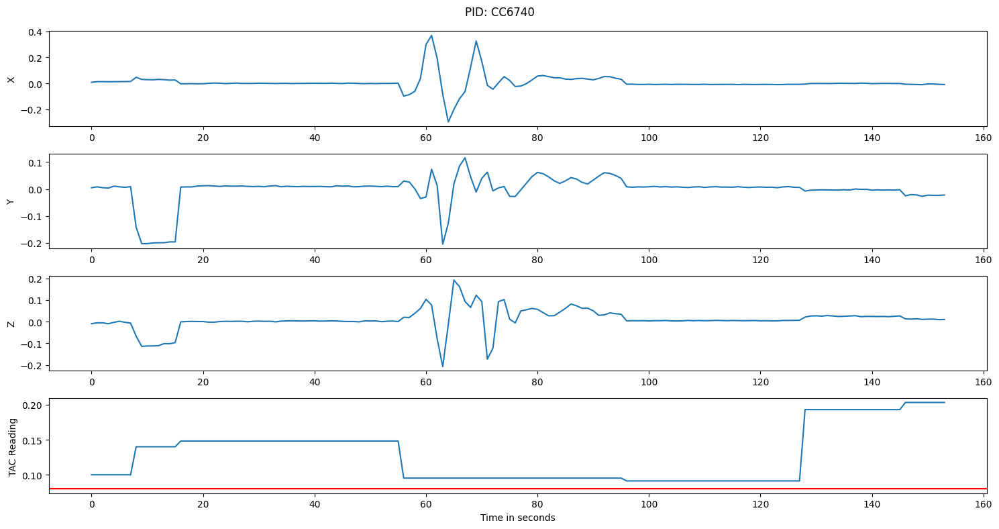

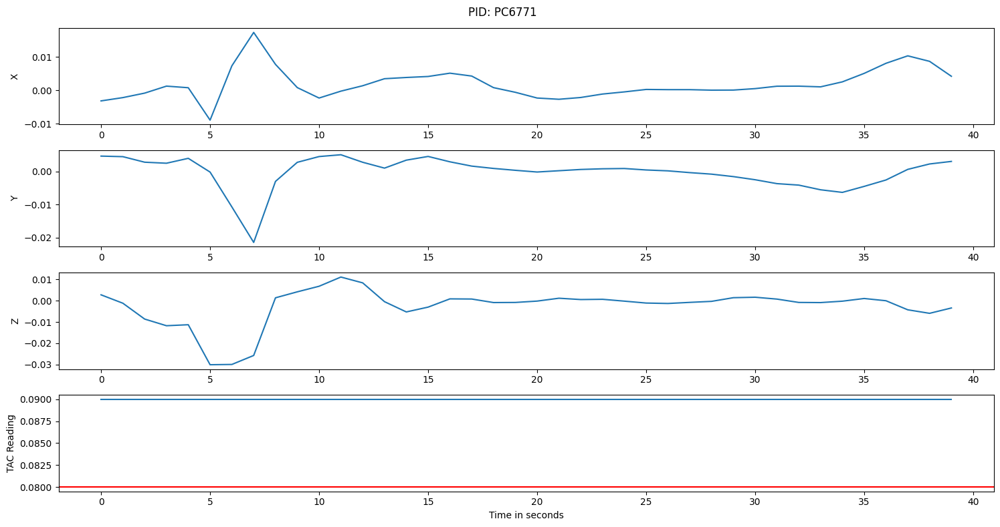

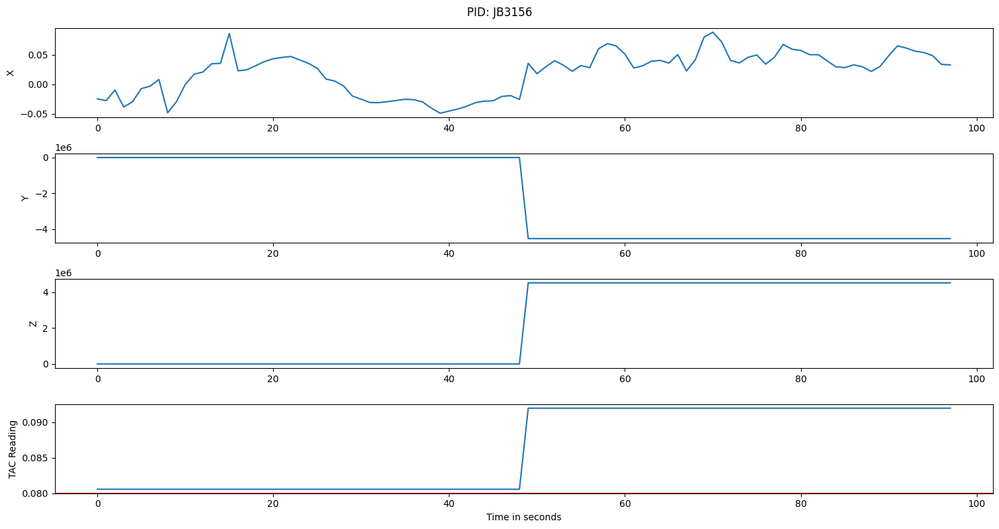

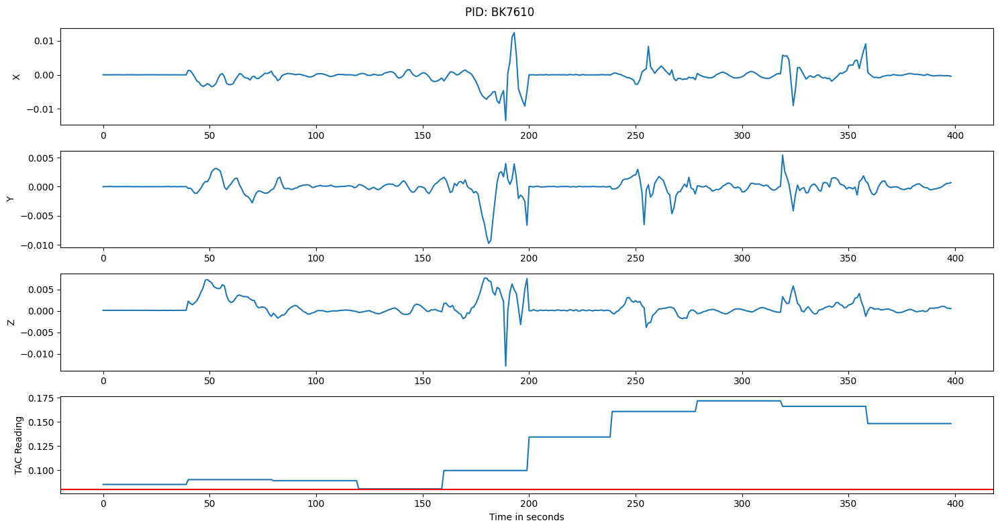

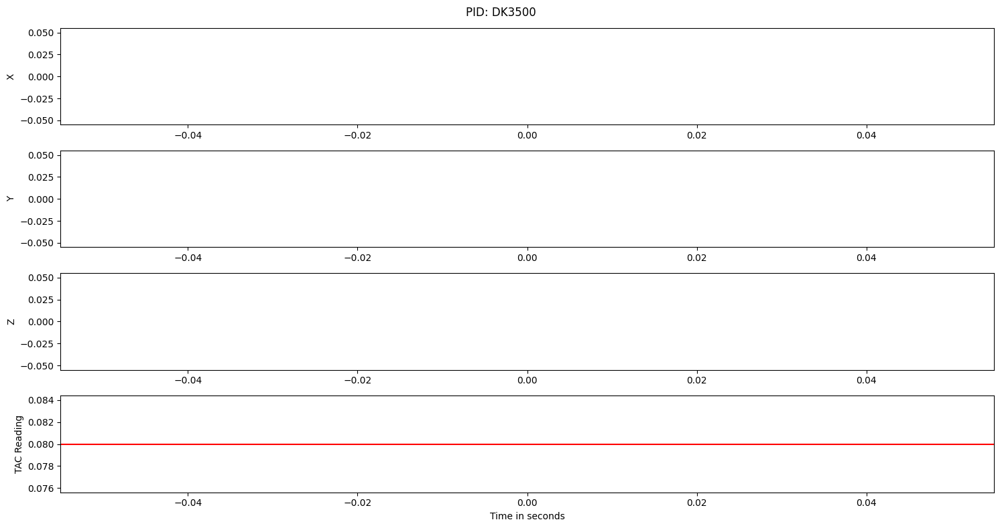

...

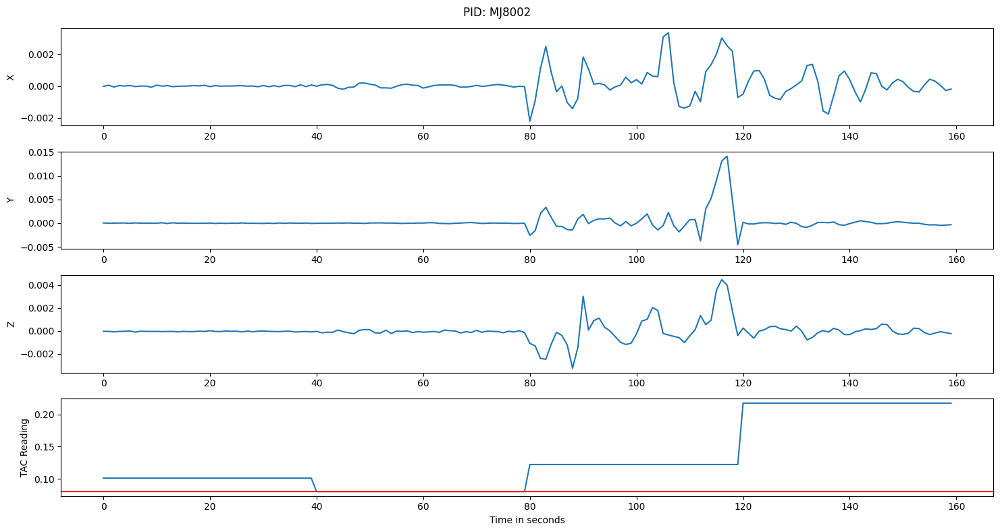

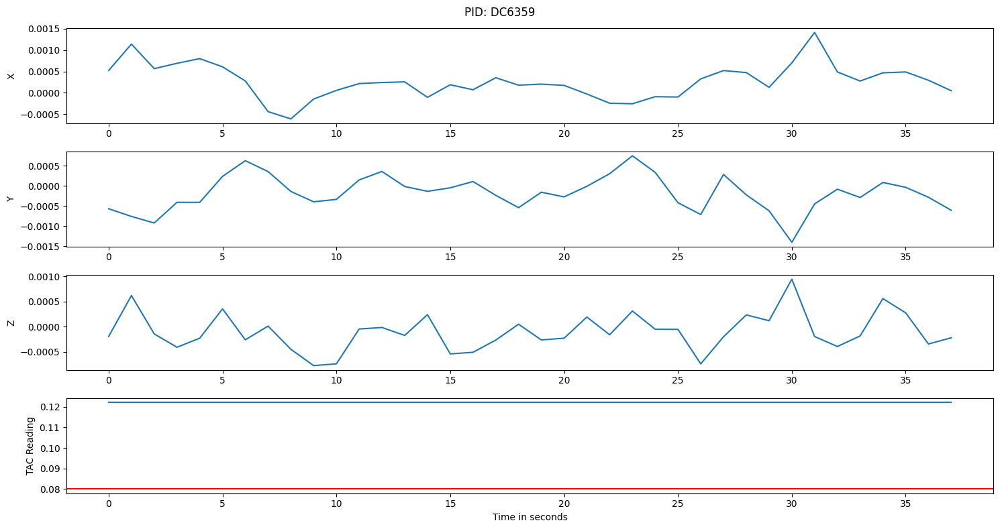

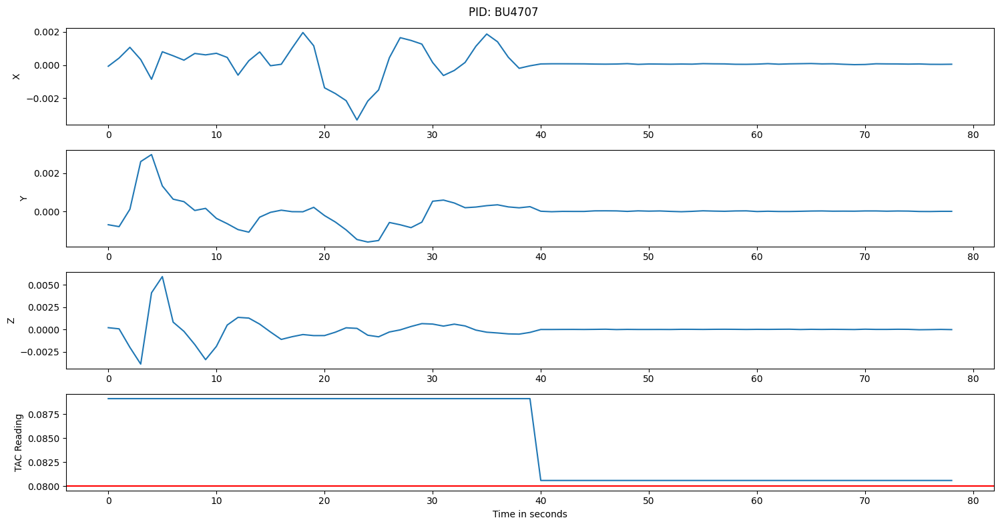

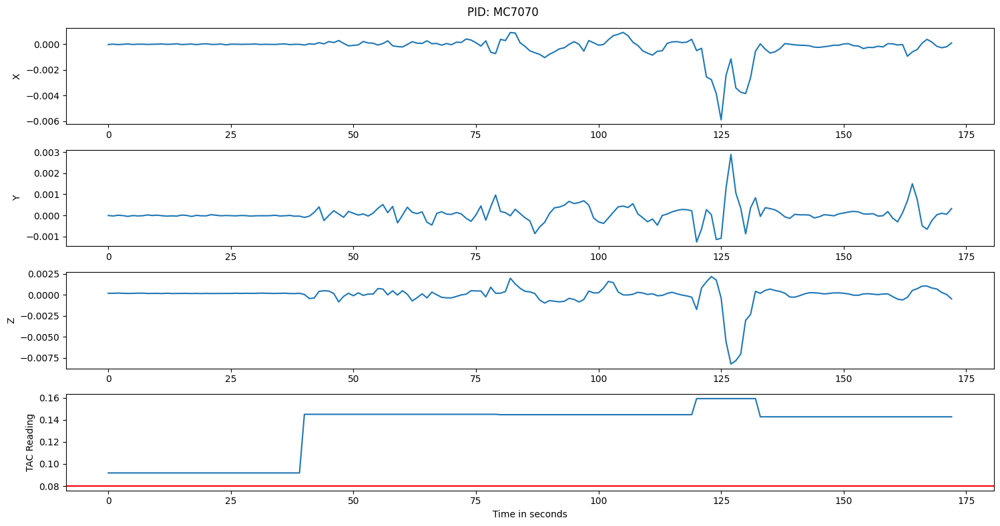

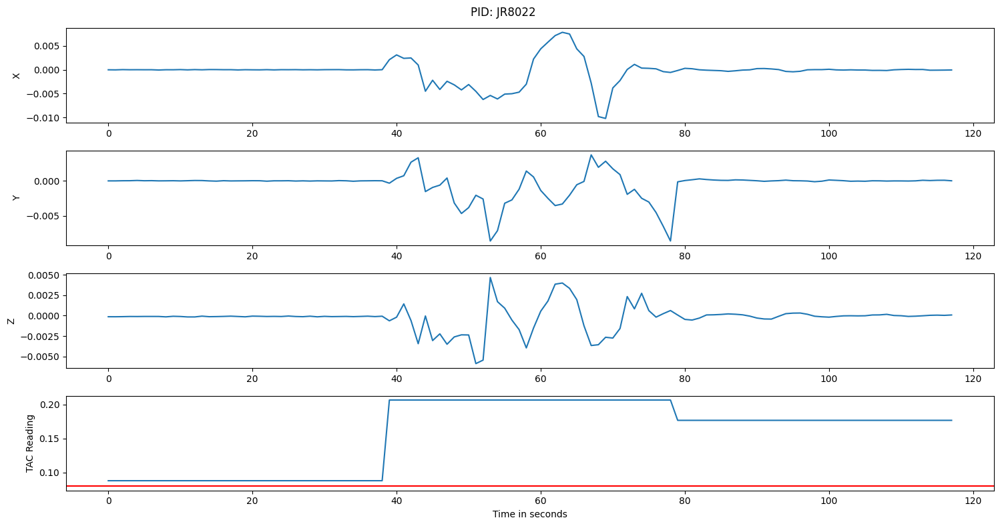

In [60]:
# Checking for each PID value what is the acceleration in x,y,z direction and the corresponding TAC level but now for drunk values

for x in index_values:
    sample_df = drunk_merged_df[(drunk_merged_df['pid'] == x)]

    fig, axes = plt.subplots(nrows=4, figsize=(15, 8))

    t = np.arange(sample_df['x'].size)
    axes[0].plot(t, "x", data=sample_df)
    axes[1].plot(t, "y", data=sample_df)
    axes[2].plot(t, "z", data=sample_df)
    axes[3].plot(t, 'TAC_Reading', data=sample_df)

    axes[3].axhline(y=0.08, color='r', linestyle='-')

    axes[0].set_ylabel('X')
    axes[1].set_ylabel('Y')
    axes[2].set_ylabel('Z')
    axes[3].set_ylabel('TAC Reading')
    axes[3].set_xlabel('Time in seconds')

    fig.suptitle(f"PID: {x}")

    plt.tight_layout()
    plt.show()